# Funcs

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pickle
import pymrio as pym
import re
import logging
from collections import namedtuple
from textwrap import wrap
from scipy.signal import find_peaks
from matplotlib.cbook import boxplot_stats

# Define a function to convert a string to snake case
def snake_case(s):
    # Replace hyphens with spaces, then apply regular expression substitutions for title case conversion
    # and add an underscore between words, finally convert the result to lowercase
    return '_'.join(
        re.sub('([A-Z][a-z]+)', r' \1',
        re.sub('([A-Z]+)', r' \1',
        s.replace('-', ' '))).split()).lower()

def lexico_reindex(mrio: pym.IOSystem) -> pym.IOSystem:
    """Re-index IOSystem lexicographicaly

    Sort indexes and columns of the dataframe of a :ref:`pymrio.IOSystem` by
    lexical order.

    Parameters
    ----------
    mrio : pym.IOSystem
        The IOSystem to sort

    Returns
    -------
    pym.IOSystem
        The sorted IOSystem

    """
    for attr in ["Z", "Y", "x", "A"]:
        if getattr(mrio, attr) is None:
            raise ValueError(
                "Attribute {} is None, did you forget to calc_all() the MRIO ?".format(
                    attr
                )
            )
    mrio.Z = mrio.Z.reindex(sorted(mrio.Z.index), axis=0)  # type: ignore
    mrio.Z = mrio.Z.reindex(sorted(mrio.Z.columns), axis=1)  # type: ignore
    mrio.Y = mrio.Y.reindex(sorted(mrio.Y.index), axis=0)  # type: ignore
    mrio.Y = mrio.Y.reindex(sorted(mrio.Y.columns), axis=1)  # type: ignore
    mrio.x = mrio.x.reindex(sorted(mrio.x.index), axis=0)  # type: ignore
    mrio.A = mrio.A.reindex(sorted(mrio.A.index), axis=0)  # type: ignore
    mrio.A = mrio.A.reindex(sorted(mrio.A.columns), axis=1)  # type: ignore

    return mrio


logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s %(message)s",
    datefmt="%Y-%m-%d %H:%M:%S",
)

logger = logging.getLogger(__name__)

from tqdm.auto import tqdm
tqdm.pandas()

import yaml

with open('../config/config.yaml') as f:
    snake_cfg = yaml.safe_load(stream=f.read())

sectors_common_aggreg = {
    sheet_name: pd.read_excel("../config/sectors_common_aggreg.ods", sheet_name=sheet_name, index_col=0)
    for sheet_name in [
        "eora26_without_reexport_to_common_aggreg",
        "euregio_to_common_aggreg",
        "exiobase_full_to_common_aggreg",
        "icio2021_reworked_to_common_aggreg",
    ]
}

regions_common_aggreg = {
    sheet_name: pd.read_excel("../config/regions_common_aggreg.ods", sheet_name=sheet_name, index_col=0)
    for sheet_name in [
        "eora26_without_reexport_to_common_aggreg",
        "euregio_to_common_aggreg",
        "exiobase_full_to_common_aggreg",
        "icio2021_reworked_to_common_aggreg",
    ]
}

def load_regions_aggreg(mrio_name):
    if "eora26" in mrio_name:
        return regions_common_aggreg["eora26_without_reexport_to_common_aggreg"]
    elif "euregio" in mrio_name:
        return regions_common_aggreg["euregio_to_common_aggreg"]
    elif "exiobase" in mrio_name:
        return regions_common_aggreg["exiobase_full_to_common_aggreg"]
    elif "oecd" in mrio_name:
        return regions_common_aggreg["icio2021_reworked_to_common_aggreg"]
    else:
        raise ValueError(f"Invalid MRIO name: {mrio_name}")

def load_sectors_aggreg(mrio_name):
    if "eora26" in mrio_name:
        return sectors_common_aggreg["eora26_without_reexport_to_common_aggreg"]
    elif "euregio" in mrio_name:
        return sectors_common_aggreg["euregio_to_common_aggreg"]
    elif "exiobase" in mrio_name:
        return sectors_common_aggreg["exiobase_full_to_common_aggreg"]
    elif "oecd" in mrio_name:
        return sectors_common_aggreg["icio2021_reworked_to_common_aggreg"]
    else:
        raise ValueError(f"Invalid MRIO name: {mrio_name}")

def aggreg_df(df,mrio_name):
    _df = df.copy()
    regions_aggreg = load_regions_aggreg(mrio_name)
    _df.rename(regions_aggreg["new region"].to_dict(), axis=1,level=0,inplace=True)
    _df = _df.groupby(["region","sector"],axis=1).sum()
    sectors_aggreg = load_sectors_aggreg(mrio_name)
    _df.rename(sectors_aggreg["new sector"].to_dict(), axis=1,level=1,inplace=True)
    _df = _df.groupby(["region","sector"],axis=1).sum()
    return _df



def drop_levels_with_identical_values(df: pd.DataFrame) -> pd.DataFrame:
    """
    Given a pandas DataFrame with a multi-level index, drop any levels for which all
    rows share the same index value.
    """
    # Get a list of the levels of the index
    levels = df.index.levels

    # Create a list of boolean masks indicating which levels should be dropped
    masks = [df.index.get_level_values(i).nunique() == 1 for i in range(len(levels))]

    # Drop the levels that should be dropped
    logger.info(
        f"Will drop these levels: { [df.index.levels[i].name for i, mask in enumerate(masks) if (mask and not df.index.levels[i].name in ['mrio','variable'] )] }"
    )
    df = df.droplevel(
        level=[
            i
            for i, mask in enumerate(masks)
            if (
                mask
                and not df.index.levels[i].name
                in ["mrio", "variable", "psi", "alpha_tau"]
            )
        ]
    )

    return df


def drop_xps(df, drop_dict):
    _df = df.copy()
    for key, val in drop_dict.items():
        if isinstance(val, str):
            val = [val]
        for v in val:
            try:
                _df.drop(index=str(v), level=key, inplace=True, axis=0)
            except KeyError:
                logger.warning(
                    f"You ask to remove rows where {key} = {val}, but none were found in the dataframe."
                )
    return _df


def prepare_df_general(inpt, drop_dict=None, drop_unused=True):
    """
    Prepare DataFrame for analysis.

    Args:
        inpt (str): Path to parquet file.
        drop_dict (dict): Dictionary of columns to drop.

    Returns:
        res_df (pandas.DataFrame): Prepared DataFrame.
    """
    res_df = pd.read_parquet(inpt)
    logger.info("Melting")
    res_df = res_df.melt(ignore_index=False).reset_index(level=["mrio", "mrio year"])
    logger.info("Joining mrio with year")
    res_df["mrio"] = res_df[["mrio", "mrio year"]].agg("_".join, axis=1)
    res_df.drop("mrio year", axis=1, inplace=True)
    res_df.set_index("mrio", append=True, inplace=True)

    if drop_dict:
        logger.info("Dropping xps to drop")
        res_df = drop_xps(res_df, drop_dict)

    if drop_unused:
        logger.info("Droping unused index levels")
        res_df = drop_levels_with_identical_values(res_df)

    logger.info("Reindexing")
    res_df = (
        res_df.reset_index()
        .set_index(["step", "region", "sector", "variable"])
        .sort_index()
    )

    col_var = list(res_df.columns[res_df.columns != "value"])
    logger.info("Experience naming")
    res_df["Experience"] = res_df[col_var].agg("~".join, axis=1)
    res_df.drop(col_var, axis=1, inplace=True)
    res_df = (
        res_df.reset_index()
        .set_index(["variable", "region", "sector", "step"])
        .sort_index()
    )

    return res_df


def prepare_df_local_analysis(inpt, region, drop_dict=None):
    """
    Prepare DataFrame for analysis for one region.

    Args:
        inpt (str): Path to parquet file.
        drop_dict (dict): Dictionary of columns to drop.

    Returns:
        res_df (pandas.DataFrame): Prepared DataFrame.
    """
    res_df = pd.read_parquet(inpt)
    logger.info("Selecting region")
    res_df = res_df.loc[:, region].sum(axis=1).copy()

    logger.info("Droping unused index levels")
    res_df = drop_levels_with_identical_values(res_df)

    res_df.name = "value"
    res_df = res_df.reset_index()

    res_df["mrio"] = res_df[["mrio", "mrio year"]].agg("_".join, axis=1)
    res_df.drop("mrio year", axis=1, inplace=True)
    res_df.set_index("mrio", inplace=True)

    if drop_dict:
        logger.info("Dropping xps to drop")
        res_df = drop_xps(res_df, drop_dict)

    logger.info("Reindexing")
    res_df = (
        res_df.reset_index()
        .set_index(["step", "variable", "recovery_sce", "mrio"])
        .sort_index()
    )

    col_var = list(res_df.columns[res_df.columns != "value"])
    logger.info("Experience naming")
    res_df["Experience"] = res_df[col_var].agg("~".join, axis=1)
    res_df.drop(col_var, axis=1, inplace=True)
    res_df = res_df.reset_index().set_index(["variable", "step"]).sort_index()
    return res_df


def prepare_df_2(df, neg_bins, pos_bins):
    def pct_change(x):
        return ((x - x.iloc[0]) / x.iloc[0]) * 100

    def yearly_pct_change_cumsum(x):
        return (x / 365).cumsum()

    max_neg_bins = list(neg_bins.values())
    max_neg_bins.append(np.inf)  #   # Define the bin edges
    max_neg_labels = neg_bins.keys()  #   # Define the bin labels
    max_pos_bins = list(pos_bins.values())
    max_pos_bins.append(
        np.inf
    )  # [-np.inf, 0, 2, 5, 10, 15, 20, 25, np.inf]  # Define the bin edges
    max_pos_labels = (
        pos_bins.keys()
    )  # ["no gains", "0%>G>2%", "2%>G>5%", "5%>G>10%", "10%>G>15%", "15%>G>20%", "20%>G>25%", "G>25%"]  # Define the bin labels

    _df = df.copy().reset_index()
    cols_to_groupby = list(
        _df.columns[(_df.columns != "value") & (_df.columns != "step")]
    )
    # _df.reset_index(inplace=True)
    # _df.set_index("step", inplace=True)
    # display(_df)
    _df["value_pct"] = _df.groupby(cols_to_groupby, axis=0, group_keys=False)[
        "value"
    ].apply(pct_change)
    _df["value_cumsum_pct"] = _df.groupby(cols_to_groupby, axis=0, group_keys=False)[
        "value_pct"
    ].apply(yearly_pct_change_cumsum)
    _df["max_neg_impact_value_pct"] = _df.groupby("Experience")["value_pct"].transform(
        min
    )
    _df["max_neg_impact_class"] = _df.groupby("Experience")[
        ["max_neg_impact_value_pct"]
    ].transform(lambda x: pd.cut(x, bins=max_neg_bins, labels=max_neg_labels))

    _df["max_pos_impact_value_pct"] = _df.groupby("Experience")["value_pct"].transform(
        max
    )
    _df["max_pos_impact_class"] = _df.groupby("Experience")[
        ["max_pos_impact_value_pct"]
    ].transform(lambda x: pd.cut(x, bins=max_pos_bins, labels=max_pos_labels))

    _df["mean_impact_value_pct"] = _df.groupby("Experience")["value_pct"].transform(
        np.mean
    )
    _df["mean_impact_class"] = _df.groupby("Experience")[
        ["mean_impact_value_pct"]
    ].transform(lambda x: pd.cut(x, bins=max_neg_bins, labels=max_neg_labels))

    _df["cumsum_pct_min"] = _df.groupby("Experience")["value_cumsum_pct"].transform(
        "min"
    )
    _df["cumsum_impact_class"] = _df.groupby("Experience")[
        ["cumsum_pct_min"]
    ].transform(lambda x: pd.cut(x, bins=max_neg_bins, labels=max_neg_labels))

    return _df

def load_mrio(filename: str, pkl_filepath) -> pym.IOSystem:
    """
    Loads the pickle file with the given filename.

    Args:
        filename: A string representing the name of the file to load (without the .pkl extension).
                  Valid file names follow the format <prefix>_full_<year>, where <prefix> is one of
                  'oecd_v2021', 'euregio', 'exiobase3', or 'eora26', and <year> is a four-digit year
                  such as '2000' or '2010'.

    Returns:
        The loaded pickle file.

    Raises:
        ValueError: If the given filename does not match the valid file name format, or the file doesn't contain an IOSystem.

    """
    regex = re.compile(
        r"^(oecd_v2021|euregio|exiobase3|eora26)_full_(\d{4})"
    )  # the regular expression to match filenames

    match = regex.match(filename)  # match the filename with the regular expression

    if not match:
        raise ValueError(f"The file name {filename} is not valid.")

    prefix, year = match.groups()  # get the prefix and year from the matched groups

    fullpath = pkl_filepath + prefix + "/" + filename + ".pkl"  # create the full file path

    logger.info(f"Loading {filename} mrio")
    with open(fullpath, "rb") as f:
        mrio = pickle.load(f)  # load the pickle file

    if not isinstance(mrio, pym.IOSystem):
        raise ValueError(f"{filename} was loaded but it is not an IOSystem")

    return mrio

def init_imp(mrio_name,aff_country,impact_as_GVA_share):
    if "exiobase" in mrio_name:
        mrio_name = mrio_name+"_ixi"
    mrio = load_mrio(mrio_name, pkl_filepath="../BoARIO-Sensitivity/mrio-files/pkls/")
    aff_regions = mrio.get_regions()[mrio.get_regions().str.contains(aff_country)]
    return ((mrio.x.T - mrio.Z.sum(axis=0)).groupby("region",axis=1).sum()[aff_regions].sum() * impact_as_GVA_share).sum()

def get_flood_scenario(mrio_name, flood_scenario, smk_config):
    regex = re.compile(
        r"(?P<basename>(?:oecd_v2021|euregio|exiobase3|eora26)_full)_(?P<year>\d\d\d\d)"
    )  # the regular expression to match filenames

    match = regex.match(mrio_name)  # match the filename with the regular expression

    if not match:
        raise ValueError(f"The file name {mrio_name} is not valid.")

    mrio_basename = match["basename"]  # get the prefix and year from the matched groups
    mrio_year = int(match["year"])
    flood_scenarios = pd.read_csv(
        smk_config["flood_scenarios"],
        index_col=[0, 1, 2],
        converters={
            "regions_affected": ast.literal_eval,
            "productive_capital_impact_regional_distrib": ast.literal_eval,
        },
    )
    scenar = flood_scenarios.loc[(mrio_basename, flood_scenario, mrio_year)]
    return scenar

def display_f(df):
    with pd.option_context('display.max_colwidth', None), pd.option_context('display.max_rows', None), pd.option_context('display.max_columns', None):
        display(df)

def treat_df_for(region):
    def count_peaks(x):
        return len(find_peaks(-x, prominence=10**-2, width=3)[0])
    
    # Load necessary data
    df_flood_readable = pd.read_csv("../config/flood_scenarios_readable.csv")
    df_flood_readable = df_flood_readable.loc[df_flood_readable["Regions affected"].str.contains("DE")]
    df = pd.read_parquet("../results/general-plot_df.parquet")
    df_flood_readable["MRIOT"] = df_flood_readable["MRIOT"] + "_full"
    
    # Filter data for the given region
    df = df[df.region == region].copy()
    
    # Split 'Experience' column and select required columns
    df[['rsce', 'psi', 'alpha_tau', 'mrio']] = df.Experience.str.split("~", expand=True)
    df = df[['rsce', 'psi', 'alpha_tau', 'mrio', 'sector', 'step', 'value', 'value_pct', 'value_cumsum_pct', 'cumsum_impact_class']].copy()

    # Merge with flood readable data
    df = df.merge(df_flood_readable[['MRIOT', 'impact']], how="left", left_on="mrio", right_on="MRIOT")

    # Extract 'rectype' and 'length' from 'rsce' column
    df[["rectype", "length"]] = df.rsce.str.extract(r"(?P<rectype>reb|rec(?:lin|S))(?P<length>\d.*)$")
    
    # Create "all" sector
    tmp = df.groupby(['mrio', 'rsce', 'rectype', 'length', 'psi', 'alpha_tau', 'step'], as_index=False)[['value', 'value_pct', 'value_cumsum_pct']].sum()
    tmp[['value_pct', 'value_cumsum_pct']] = tmp[['value_pct', 'value_cumsum_pct']] / 6
    tmp["sector"] = "all"
    ## Concatenate aggregated data with original dataframe
    df=df[['mrio', 'rsce', 'rectype', 'length', 'psi', 'alpha_tau', 'step', 'sector', 'value', 'value_pct', 'value_cumsum_pct']].copy()
    df = pd.concat([df, tmp])
    
    # Calculate 'value_imp' column
    df["value_diff"] = df.groupby(["mrio", "rsce", "psi", "alpha_tau", "sector"])["value"].transform(lambda x: x - x.iloc[0])       
    df["value_imp"] = (df["value_diff"] / df["impact"]) * 100    
    # Calculate 'value_imp_c' column
    df["value_imp_c"] = df.groupby(["mrio", "rsce", "psi", "alpha_tau", "sector"])["value_imp"].transform("cumsum")
    
    # Calculate 'n_peaks' column
    df["n_peaks"] = df.groupby(["mrio", "rsce", "psi", "alpha_tau", "sector"])['value_pct'].transform(count_peaks)
    df.to_parquet(f"./parquets_cache/sensitivity_full_sims_{region}_full_df.parquet")

def make_plot_df_for(region):
    df = pd.read_parquet(f"./parquets_cache/sensitivity_full_sims_{region}_full_df.parquet")
    # Create subsets for plotting
    # Handle absurd indexes
    if region == "DEU":
        absurd_set = df[(df.sector == "all") & (df.value_imp_c.abs() > 500)][["rsce", "psi", "alpha_tau"]]
        absurd_set.to_parquet("./parquets_cache/absurd_indexes.parquet")
    else:
        absurd_set = pd.read_parquet("./parquets_cache/absurd_indexes.parquet")

    df["absurd"] = df.set_index(["rsce", "psi", "alpha_tau"]).index.isin(absurd_set.set_index(["rsce", "psi", "alpha_tau"]).index)
    
    df_plot1 = df[df.step == df.step.max() // 3].copy()
    df_plot1["time_looked"] = "1y"
    df_plot2 = df[df.step == (df.step.max() // 3)*2].copy()
    df_plot2["time_looked"] = "2y"
    df_plot3 = df[df.step == df.step.max()].copy()
    df_plot3["time_looked"] = "3y"
    df_plot = pd.concat([df_plot1, df_plot2, df_plot3])

    # Select relevant columns for plotting
    df_plot = df_plot[['mrio', 'rsce', 'rectype', 'length', 'psi', 'alpha_tau', 'time_looked', 'sector', 'value', 'value_pct', 'value_cumsum_pct', 'value_diff', 'value_imp', 'value_imp_c', "n_peaks", "absurd"]].copy()

    # Save dataframe to parquet file
    df_plot.to_parquet(f"./parquets_cache/sensitivity_full_sims_{region}_plot_df.parquet")

def renaming(plot_df):
    plot_df['Shortage_b'] = np.where(plot_df['n_peaks'] > 1,1,0)
    plot_df['Shortage'] = plot_df.groupby(["mrio","rsce","psi","alpha_tau"])["Shortage_b"].transform(any)
    plot_df['Shortage'] = np.where(plot_df['Shortage'],"Yes","No")
    plot_df.rectype = plot_df.rectype.map({"reclin":"Without rebuilding demand","reb":"With rebuilding demand"})
    plot_df.sector = plot_df.sector.replace({"all":"All sectors"})
    plot_df["mrio_name"] = plot_df.mrio.replace({
        "eora26_2000_full":"EORA26",
        "exiobase3_ixi_2000_full":"EXIOBASE 3",
        "euregio_2000_full":"EUREGIO",
        "eora26_2010_full":"EORA26",
        "exiobase3_ixi_2010_full":"EXIOBASE 3",
        "euregio_2010_full":"EUREGIO",
    })
    
    
    plot_df["MRIOT Year"] = plot_df.mrio.replace({
        "eora26_2000_full":"2000",
        "exiobase3_ixi_2000_full":"2000",
        "euregio_2000_full":"2000",
        "eora26_2010_full":"2010",
        "exiobase3_ixi_2010_full":"2010",
        "euregio_2010_full":"2010",
    })
    
    plot_df["mrio_name_full"] = plot_df.mrio.replace({
        "eora26_2000_full":"EORA26 2000",
        "exiobase3_ixi_2000_full":"EXIOBASE3 2000",
        "euregio_2000_full":"EUREGIO 2000",
        "eora26_2010_full":"EORA26 2010",
        "exiobase3_ixi_2010_full":"EXIOBASE3 2010",
        "euregio_2010_full":"EUREGIO 2010",
    })
    
    plot_df["Overproduction pace"] = plot_df["alpha_tau"].astype(int)
    plot_df["Recovery length (days)"] = plot_df.length.replace({
        "3M":90,
        "6M":180,
        "1Y":365,
        "1_5Y":545,
        "2Y":730,
    }).astype(int)
    return plot_df

def query_to_str(query):
    if query is None:
        return ""
    replacements = {'>': '_gr_', '>=': '_greq_', '<': '_ls_', '<=': '_lseq_', '!=': '_neq_', '==': '_eq_', ' ': '_', '.':'_'}
    for key, value in replacements.items():
        query = query.replace(key, value)
    query = query.replace("'", "")  # Remove single quotes if present
    query = query.replace('"', "")  # Remove double quotes if present
    return "_"+query

def plot_graph(plot_df, var_to_look, param, region, sharey=False, trenzcek=False, absurd=False, query=None, hallegatte=False, time_looked="2y", save=True, show_table=False, subtitle=True, annotate_values=False):
    if not absurd:
        plot_df_noabs = plot_df.loc[~plot_df.absurd].copy()
    else:
        plot_df_noabs = plot_df.copy()
    if query:
        plot_df_noabs = plot_df_noabs.query(query).copy()
    if hallegatte:
        plot_df_noabs = plot_df_noabs.loc[(plot_df_noabs["psi"]=="0.8") & (plot_df_noabs["alpha_tau"]=="365")].copy()
    plot_df_noabs = plot_df_noabs.sort_values(by=["mrio_name_full", param])
    plot_df_noabs = plot_df_noabs.loc[(plot_df_noabs.time_looked == time_looked) & (plot_df_noabs.sector.str.contains("All"))].copy()

    graph = sns.catplot(
        kind="strip",
        jitter=0.25,
        y=var_to_look,
        x="mrio_name",
        hue=param,
        dodge=True,
        size=5.5,
        alpha=0.8,
        col="rectype",
        col_order=["Without rebuilding demand", "With rebuilding demand"],
        palette=sns.color_palette("colorblind"),
        data=plot_df_noabs,
        height=7,
        aspect=0.8,
        sharey=sharey,
    )

    graph.map_dataframe(
        sns.boxplot,
        linewidth=1.75,
        width=0.9,
        orient="v",
        color="white",
        fliersize=0,
        y=var_to_look,
        x="mrio_name",
    )

    graph.map(plt.axhline, y=0, ls="-", c="black")

    ax = graph.facet_axis(0, 0)
    ax2 = graph.facet_axis(0, 1)
    if var_to_look=="value_imp_c":
        graph.set_axis_labels("", "% of direct losses")
    elif var_to_look=="value_cumsum_pct":
        graph.set_axis_labels("", "% of yearly production")
    graph.set_titles("{col_name}")

    time_name = "two years" if time_looked=="2y" else "three years" if time_looked=="3y" else "one year" if time_looked=="1y" else "unknown"
    plt.text(x=0.5, y=1.04, s=f"Indirect production change in {region} {time_name} after the shock", fontsize=16, ha="center", transform=graph.figure.transFigure)
    if subtitle:
        if absurd:
            subtlt = "All simulations"
        else:
            subtlt = "Restricted parameter set"
            
        if query:
            subtlt += f" and {query.replace("alpha_tau","tau_alpha")}"
        
        if hallegatte:
            subtlt += f" using psi=0.8 and tau_alpha=365"
        
        plt.text(x=0.5, y=1.00, s= subtlt, fontsize=14, ha="center", transform=graph.figure.transFigure)
    #graph.fig.suptitle(, y=1.05)

    graph.despine(left=True, bottom=True)
    ax.tick_params(bottom=False)
    ax2.tick_params(bottom=False)

    if annotate_values:
        for col, ax in graph.axes_dict.items():
            for mrio_n in np.unique(plot_df_noabs["mrio_name"]):
                group = plot_df_noabs.loc[(plot_df_noabs["rectype"] == col) & (plot_df_noabs["mrio_name"] == mrio_n), :]
                median = boxplot_stats(group[var_to_look])[0]["med"]
                low = group[var_to_look].min()
                up = group[var_to_look].max()
                ax.annotate(f' {median:.2f}', xy=(mrio_n, median))
                ax.annotate(f' {low:.2f}', xy=(mrio_n, low))
                ax.annotate(f' {up:.2f}', xy=(mrio_n, up))
    
    if trenzcek:
        graph.map(plt.axhline,y=-0.21*100, ls="--", c="black")
        ax.annotate('Trenczek and Lürh, 2022 (−21%)', xy=(0.35,-21),
            xycoords=('axes fraction',"data"),
            xytext=(-110,-40),
            arrowprops=dict(facecolor='black', edgecolor="black",arrowstyle="-|>", connectionstyle="arc3",relpos=(0.5, 0.5)),
            textcoords='offset points',
            color="black",
            fontsize=12, 
            ha="left",
            #rotation=90,
                   )
    graph.fig.subplots_adjust(wspace=.2)
    if save:
        suffix = query_to_str(query)
        if hallegatte:
            suffix += "_hallegatte"
        name = f"{'' if absurd else 'no_outliers_'}aggregated_influence_of_{snake_case(param)}_in_{region}_{var_to_look}{suffix}"
        print(f"Saving {name}")
        graph.savefig(f"/home/sjuhel/imgs-general/Plots/Sensitivity/{name}.png")
        plot_df_noabs.groupby(["rectype","mrio_name"])['value_imp_c'].describe().to_csv(f"/home/sjuhel/Repos/BoARIO-Sensitivity/results/tables/{name}.csv")
    if show_table:
        table1 = plot_df_noabs.groupby(["rectype","mrio_name"])['value_imp_c'].describe()
        table2 = plot_df_noabs.groupby(["rectype","mrio_name","MRIOT Year"])['value_imp_c'].describe()
        display(table1.style.background_gradient(cmap="plasma").format(precision=0, thousands=".", decimal=","))
        display(table2.style.background_gradient(cmap="plasma").format(precision=0, thousands=".", decimal=","))

def plot_sector_boxplot(plot_df, region, param, sharey=False, absurd=False, query=None, hallegatte=False, time_looked="3y", save=True, show_table=False, subtitle=True, annotate_values=False):
    if not absurd:
        plot_df_noabs = plot_df.loc[~plot_df.absurd].copy()
    else:
        plot_df_noabs = plot_df.copy()
    if query:
        plot_df_noabs = plot_df_noabs.query(query).copy()
    plot_df_noabs = plot_df_noabs.sort_values(by=["mrio_name_full", param])
    plot_df_noabs = plot_df_noabs.loc[(plot_df_noabs.time_looked == time_looked)]

    graph = sns.catplot(
        kind="strip",
        jitter=0.25,
        y="value_cumsum_pct",
        x="sector",
        hue=param,
        size=5.,
        alpha=0.5,
        dodge=True,
        col="rectype",
        col_order=["Without rebuilding demand", "With rebuilding demand"],
        sharey=sharey,
        palette=sns.color_palette("colorblind"),
        data=plot_df_noabs,
        height=7,
        aspect=1.1
    )

    graph.map_dataframe(
        sns.boxplot,
        linewidth=1.75,
        width=0.9,
        orient="v",
        color="white",
        fliersize=0,
        y="value_cumsum_pct",
        x="sector",
    )

    graph.map(plt.axhline, y=0, ls="-", c="black")

    ax = graph.facet_axis(0, 0)
    ax2 = graph.facet_axis(0, 1)

    labels = ax.get_xticklabels()
    for v in labels:
        text = v.get_text()
        text = '\n'.join(wrap(text, 20))
        v.set_text(text)
    graph.set_xticklabels(labels, rotation=90)
    #graph.set_yticklabels(ax.get_yticklabels(), rotation=30)

    graph.set_axis_labels("", "% of yearly production")
    graph.set_titles("{col_name}")
    time_name = "two years" if time_looked=="2y" else "three years" if time_looked=="3y" else "one year" if time_looked=="1y" else "unknown"
    plt.text(x=0.5, y=1.04, s=f"Indirect production change in {region} {time_name} after the shock", fontsize=16, ha="center", transform=graph.figure.transFigure)
    if subtitle:
        if absurd:
            subtlt = "All simulations"
        else:
            subtlt = "Restricted parameter set"
            
        if query:
            subtlt += f" and {query.replace("alpha_tau","tau_alpha")}"
        
        if hallegatte:
            subtlt += f" using psi=0.8 and tau_alpha=365"
        
        plt.text(x=0.5, y=1.00, s= subtlt, fontsize=14, ha="center", transform=graph.figure.transFigure)

    if annotate_values:
        for col, ax in graph.axes_dict.items():
            for sector_n in np.unique(plot_df_noabs["sector"]):
                group = plot_df_noabs.loc[(plot_df_noabs["rectype"] == col) & (plot_df_noabs["sector"] == sector_n), :]
                low = group["value_cumsum_pct"].min()
                up = group["value_cumsum_pct"].max()
                median = boxplot_stats(group["value_cumsum_pct"])[0]["med"]
                ax.annotate(f' {median:.2f}', xy=(sector_n, median))
                ax.annotate(f' {low:.2f}', xy=(sector_n, low))
                ax.annotate(f' {up:.2f}', xy=(sector_n, up))
    
    graph.despine(left=True, bottom=True)
    ax.tick_params(bottom=False)
    ax2.tick_params(bottom=False)
    if param=="mrio_name":
        title = ""
    else:
        title = param
    sns.move_legend(graph, title=title, loc="center right", bbox_to_anchor=(0.98, 0.5))
    if save:
        suffix = query_to_str(query)
        if hallegatte:
            suffix += "_hallegatte"
        name = f"{'' if absurd else 'no_outliers_'}per_sectors_influence_of_{snake_case(param)}_in_{region}_value_cumsum_pct{suffix}"
        print(f"Saving {name}")
        graph.savefig(f"/home/sjuhel/imgs-general/Plots/Sensitivity/{name}.png",)
        plot_df_noabs.groupby(["rectype","sector","mrio_name"])['value_imp_c'].describe().to_csv(f"/home/sjuhel/Repos/BoARIO-Sensitivity/results/tables/{name}.csv")
    if show_table:
        table1 = plot_df_noabs.groupby(["rectype","sector","mrio_name"])['value_cumsum_pct'].describe()
        table2 = plot_df_noabs.groupby(["rectype","sector","mrio_name","MRIOT Year"])['value_cumsum_pct'].describe()
        display(table1.style.background_gradient(cmap="plasma").format(precision=2, thousands=".", decimal=","))
        display(table2.style.background_gradient(cmap="plasma").format(precision=2, thousands=".", decimal=","))

def show_table(plot_df, var_to_look, param, region, absurd=False, query=None, hallegatte=False, time_looked="2y", precision=1):
    if not absurd:
        plot_df_noabs = plot_df.loc[~plot_df.absurd].copy()
    else:
        plot_df_noabs = plot_df.copy()
    if query:
        plot_df_noabs = plot_df_noabs.query(query).copy()
    if hallegatte:
        plot_df_noabs = plot_df_noabs.loc[(plot_df_noabs["psi"]=="0.8") & (plot_df_noabs["alpha_tau"]=="365")].copy()
    plot_df_noabs = plot_df_noabs.sort_values(by=["mrio_name_full", param])
    plot_df_noabs = plot_df_noabs.loc[(plot_df_noabs.time_looked == time_looked) & (plot_df_noabs.sector.str.contains("All"))].copy()

    table1 = plot_df_noabs.groupby(["rectype","mrio_name",param])[var_to_look].describe()
    display(table1.style.background_gradient(cmap="plasma").format(precision=precision, thousands=".", decimal=","))

# General first hand analysis

### parameters stuff (to check)

In [ ]:
#logger.addHandler(logging.StreamHandler())

# Create a dictionary of lists for the given parameters
notebook_params_space = {
    'mrio': ["eora26_full_2000","eora26_full_2010",'exiobase3_full_2000_ixi',
             'exiobase3_full_2010_ixi', "euregio_full_2000", "euregio_full_2010"], 
    #'year': [2000, 2010],
    #'region_affected': [
    #    'DE',
        #'CN'
    #],
    'order': [
        'alt',
    #    'noalt'
    ],
    'psi': [
        #0.1,
        0.5,
        0.8,
        0.85,
        0.90,
        0.95,
        0.97,
        1.
    ],
    'base_alpha': [
        1
                  ],
    'max_alpha': [
        1.25,
        #1.35
    ],
    'tau_alpha': [
    #    30,
        90,
        180,
        365,
        530
    ],
    'sectors_scenario': [
        'default',
    ],
    'recovery_scenario': [
    "reclin3M",
  "reclin6M",
#  "recS6M",
  "reclin1Y",
  "reclin1_5Y",
  "reclin2Y",
#  "recS1Y",
#  "recS1_5Y",
  "reb3M",
  "reb6M",
  "reb1Y",
  "reb1_5Y",
  "reb2Y",
    ],
    'flood_scenario': [
        "germany21"
    ]
}

# Create a dataframe from the dictionary
notebook_params_space = pd.MultiIndex.from_product(notebook_params_space.values(), names=notebook_params_space.keys()).to_frame(index=False)
# notebook_params_space.to_csv("..config/parameters_space_building.csv", index=False)

In [ ]:
notebook_params_space

In [ ]:
#notebook_params_space.to_csv("../BoARIO-Sensitivity/config/parameters_space.csv", index=False)

In [ ]:
res_df = prepare_df_general("../BoARIO-Sensitivity/results/common_aggreg.parquet")
plot_df = prepare_df_2(res_df,
                       snake_cfg["impacts_bins"],
                       snake_cfg["gains_bins"]
                      )

In [ ]:
xp_to_remove_add = plot_df.loc[plot_df.loc[:,"cumsum_impact_class"] >= "absurd","Experience"]#.drop_duplicates()#.unique()#.str.split("~",expand=True)

In [ ]:
bins = list(snake_cfg["impacts_bins"].values())
print(bins)

labels = list(snake_cfg["impacts_bins"].keys())
print(labels)

In [ ]:
test = plot_df.copy()
test.query("cumsum_impact_class > 'absurd'", inplace=True)
test

In [ ]:
a = reversed(snake_cfg["impacts_bins"].keys())
print(list(a))
b = reversed(snake_cfg["impacts_bins"].values())
print(list(b))


In [ ]:
total_losses = pd.read_parquet("../results/general-plot_df.parquet")

In [ ]:
total_losses

In [ ]:
total_losses = total_losses[["region","sector","step","value","Experience"]]
total_losses["value_diff"] = total_losses.groupby(["region","sector","Experience"])["value"].transform(lambda x : x - x.iloc[0])
total_losses = total_losses.groupby(["Experience","region"])["value_diff"].sum()
total_losses = total_losses.reset_index()
total_losses[["rec_sce","psi", "alpha_tau", "mrio"]] = total_losses.Experience.str.split("~",expand=True)
total_losses["Production change relative to direct shock (30B€)"] = total_losses["value_diff"] * (10**6/(30*10**9))
total_losses_DE = total_losses.loc[total_losses.region=="DEU"].copy()

In [ ]:
total_losses

In [ ]:
xp_to_remove_add = pd.concat([total_losses_DE[total_losses_DE.value_diff.abs() > 5*30000].Experience,xp_to_remove_add],axis=0).drop_duplicates()

In [ ]:
xp_to_remove_add

In [ ]:
xp_to_remove_add = xp_to_remove_add.str.split("~",expand=True)
xp_to_remove_add.columns = ["recovery_scenario","psi","tau_alpha","mrio"]
xp_to_remove_add.loc[xp_to_remove_add.mrio.str.startswith("exiobase3"),"mrio"] = xp_to_remove_add.loc[xp_to_remove_add.mrio.str.startswith("exiobase3"),"mrio"]+"_ixi"
xp_to_remove_add

In [ ]:
try:
    xp_to_remove = pd.read_csv("../BoARIO-Sensitivity/config/xp_to_remove.csv", names=["recovery_scenario","psi","tau_alpha","mrio"])
except FileNotFoundError:
    xp_to_remove = pd.DataFrame()
    
pd.concat([xp_to_remove,xp_to_remove_add]).drop_duplicates().to_csv("../BoARIO-Sensitivity/config/xp_to_remove.csv", index=False, header=False)

params_space = pd.read_csv("../BoARIO-Sensitivity/config/parameters_space_building.csv")
xp_to_remove = pd.read_csv("../BoARIO-Sensitivity/config/xp_to_remove.csv", names=["recovery_scenario","psi","tau_alpha","mrio"])
xp_to_remove.set_index(["recovery_scenario","psi","tau_alpha","mrio"],inplace=True)
params_space.set_index(["recovery_scenario","psi","tau_alpha","mrio"],inplace=True)

In [ ]:
xp_to_remove

In [ ]:
params_space = params_space.drop(xp_to_remove.index, errors="ignore")

In [ ]:
params_space.reset_index()

In [ ]:
params_space.reset_index()[["mrio","order","psi","base_alpha","max_alpha","tau_alpha","sectors_scenario","recovery_scenario","flood_scenario"]].to_csv("../BoARIO-Sensitivity/config/parameters_space.csv",index=False)

In [ ]:
pd.read_csv("../BoARIO-Sensitivity/config/parameters_space.csv").groupby("mrio").sample(1, random_state=1).to_csv("../BoARIO-Sensitivity/config/parameters_space_test.csv",index=False)

In [ ]:
params_space.reset_index()

# Flood scenarios

In [ ]:
mrio = load_mrio("euregio_full_2010", "../../Data/data-mriot/pkls/")
mrio.get_regions()[mrio.get_regions().str.contains("DE")]

In [ ]:
mrio = load_mrio("exiobase3_full_2010", "../../Data/data-mriot/pkls/")
mrio.get_regions()[mrio.get_regions().str.contains("JP")]

In [ ]:
(mrio.x.T - mrio.Z.sum(axis=0)).groupby("region",axis=1).sum()["DE"]

In [ ]:
tmp2 = pd.Series([
            0.0046057242082654755,
            0.01687811919847528,
            0.000435120135527202,
            6.0050249275546e-05,
            0.0001757071905317333,
            1.9078363256291237e-05,
            0.000895982570460311,
            0.0012319973792574495,
            0.00016719183123763053,
            0.0014769374980126051,
            0.004891517387085255,
            0.0004698571762769888,
            6.3196018458983575e-06,
            0.014816908575385413,
            0.0009380935050203381,
            0.0009765605954465498,
            0.0006800048250428377,
            0.0005314619819669295,
            0.00019133484138808137,
            0.002231019560906867,
            0.0011467978850544503,
            0.011057882584421188,
            0.04316673958968223,
            0.0001951411168853459,
            0.0016739292102322498,
            1.4724888025430128e-06,
            0.07059893010080293,
            0.035186846595791424,
            0.0006421142288516084,
            0.001070130862973353,
            0.0008738012994480148,
            0.0009171232641628609,
            0.0009082117144139156,
            0.00015362691045364994,
            0.0005601688598165552,
            0.0003352707183847838,
            0.008171068430895259,
            4.271932777532741e-06,
            0.0001799020491253782,
            8.990797393648109e-06,
            1.3639811772094961e-05,
            3.324308226674999e-07,
            7.99051388681915e-06,
            2.552931808416825e-05,
            0.004417246809629573,
            0.0019002061858216213,
            0.00041359452912438844,
            0.002109363987426356,
            0.0008726535383475197,
            7.845895893444209e-06,
            0.01858354981335572,
            0.02299850193793092,
            0.00024392978074025797,
            0.0076089242540118805,
            0.00702853438709419,
            0.0008152348892734837,
            0.04074721924406175,
            0.012670191028279636,
            0.04242328763951666,
            0.001956575760752741,
            0.0013615376204580635,
            0.007393545987570305,
            0.00883595641036803,
            0.010062143679504941,
            0.0024673043363625928,
            0.0005511887886964319,
            0.001499606272183263,
            0.0032286361304427603,
            0.00026516943072313077,
            0.00017839292679261106,
            0.001158403546414151,
            9.492149085615462e-08,
            1.3254099210600571e-06,
            4.7864634436177585e-05,
            1.273640191429829e-06,
            1.1577609390204498e-05,
            0.08385623104862328,
            0.02200156553699276,
            0.0001109731137089854,
            0.01431130828257732,
            0.00020195661081493047,
            0.0015542132172432041,
            0.004539316307322268,
            0.00017636533041361996,
            0.015209650275762323,
            0.03280306959116413,
            0.0010436002453898295,
            7.352390411323204e-05,
            0.004360671714875893,
            4.8968013702121986e-05,
            0.005453975652682299,
            0.0014578242826245045,
            0.0004697514895703844,
            0.0006900524904353947,
            0.00167715293406606,
            4.703433407360229e-05,
            0.0011543290670649488,
            9.492149085615462e-08,
            0.00042257337431355187,
            0.0034339647041178698,
            0.0012555762619437534,
            0.0004118249764589294,
            0.0032735500604369797,
            0.00011374748509514317,
            0.0001121480079273802,
            0.000823670395345481,
            0.00021444478373543923,
            0.0078075739942542405,
            0.055145465559415116,
            0.012053324479995287,
            0.0003284137148548914,
            0.0009244534663488101,
            0.0006623178149101174,
            0.0021062035866684,
            0.0004035699479301873,
            0.0006621091061823634,
            0.0003135671764155011,
            5.175452515650752e-07,
            0.00038248362967316797,
            1.3449377148568944e-05,
            0.0019037741331197947,
            0.002676586324576074,
            0.0016116138207235926,
            0.0005992804689085096,
            0.11500723472710325,
            0.01945304085862609,
            0.0008678290682895934,
            0.001121407368866716,
            0.01474249251813889,
            0.005936961153649257,
            0.0011083676454861978,
            0.019039569611418623,
            0.02517794124420774,
            0.0002015669664699175,
            0.0008812099427581354,
            0.0286178138004102,
            0.0006245878706099289,
            0.003098155910759644,
            0.008851448452889606,
            0.00017879462181085711,
            0.00041399829446481506,
            0.03533915782381334,
            8.091439590943976e-07
        ], index=pd.MultiIndex.from_product([["DE"],sectors_df.loc[(sectors_df.affected==1)].index]))

In [ ]:
len([
            0.0046057242082654755,
            0.01687811919847528,
            0.000435120135527202,
            6.0050249275546e-05,
            0.0001757071905317333,
            1.9078363256291237e-05,
            0.000895982570460311,
            0.0012319973792574495,
            0.00016719183123763053,
            0.0014769374980126051,
            0.004891517387085255,
            0.0004698571762769888,
            6.3196018458983575e-06,
            0.014816908575385413,
            0.0009380935050203381,
            0.0009765605954465498,
            0.0006800048250428377,
            0.0005314619819669295,
            0.00019133484138808137,
            0.002231019560906867,
            0.0011467978850544503,
            0.011057882584421188,
            0.04316673958968223,
            0.0001951411168853459,
            0.0016739292102322498,
            1.4724888025430128e-06,
            0.07059893010080293,
            0.035186846595791424,
            0.0006421142288516084,
            0.001070130862973353,
            0.0008738012994480148,
            0.0009171232641628609,
            0.0009082117144139156,
            0.00015362691045364994,
            0.0005601688598165552,
            0.0003352707183847838,
            0.008171068430895259,
            4.271932777532741e-06,
            0.0001799020491253782,
            8.990797393648109e-06,
            1.3639811772094961e-05,
            3.324308226674999e-07,
            7.99051388681915e-06,
            2.552931808416825e-05,
            0.004417246809629573,
            0.0019002061858216213,
            0.00041359452912438844,
            0.002109363987426356,
            0.0008726535383475197,
            7.845895893444209e-06,
            0.01858354981335572,
            0.02299850193793092,
            0.00024392978074025797,
            0.0076089242540118805,
            0.00702853438709419,
            0.0008152348892734837,
            0.04074721924406175,
            0.012670191028279636,
            0.04242328763951666,
            0.001956575760752741,
            0.0013615376204580635,
            0.007393545987570305,
            0.00883595641036803,
            0.010062143679504941,
            0.0024673043363625928,
            0.0005511887886964319,
            0.001499606272183263,
            0.0032286361304427603,
            0.00026516943072313077,
            0.00017839292679261106,
            0.001158403546414151,
            9.492149085615462e-08,
            1.3254099210600571e-06,
            4.7864634436177585e-05,
            1.273640191429829e-06,
            1.1577609390204498e-05,
            0.08385623104862328,
            0.02200156553699276,
            0.0001109731137089854,
            0.01431130828257732,
            0.00020195661081493047,
            0.0015542132172432041,
            0.004539316307322268,
            0.00017636533041361996,
            0.015209650275762323,
            0.03280306959116413,
            0.0010436002453898295,
            7.352390411323204e-05,
            0.004360671714875893,
            4.8968013702121986e-05,
            0.005453975652682299,
            0.0014578242826245045,
            0.0004697514895703844,
            0.0006900524904353947,
            0.00167715293406606,
            4.703433407360229e-05,
            0.0011543290670649488,
            9.492149085615462e-08,
            0.00042257337431355187,
            0.0034339647041178698,
            0.0012555762619437534,
            0.0004118249764589294,
            0.0032735500604369797,
            0.00011374748509514317,
            0.0001121480079273802,
            0.000823670395345481,
            0.00021444478373543923,
            0.0078075739942542405,
            0.055145465559415116,
            0.012053324479995287,
            0.0003284137148548914,
            0.0009244534663488101,
            0.0006623178149101174,
            0.0021062035866684,
            0.0004035699479301873,
            0.0006621091061823634,
            0.0003135671764155011,
            5.175452515650752e-07,
            0.00038248362967316797,
            1.3449377148568944e-05,
            0.0019037741331197947,
            0.002676586324576074,
            0.0016116138207235926,
            0.0005992804689085096,
            0.11500723472710325,
            0.01945304085862609,
            0.0008678290682895934,
            0.001121407368866716,
            0.01474249251813889,
            0.005936961153649257,
            0.0011083676454861978,
            0.019039569611418623,
            0.02517794124420774,
            0.0002015669664699175,
            0.0008812099427581354,
            0.0286178138004102,
            0.0006245878706099289,
            0.003098155910759644,
            0.008851448452889606,
            0.00017879462181085711,
            0.00041399829446481506,
            0.03533915782381334,
            8.091439590943976e-07
        ])

In [ ]:
sectors_df.loc[(sectors_df.affected==1)].index

In [ ]:
tmp = pd.Series([
            1.0596463183284324e-05,
            7.52468673465397e-05,
            5.169123912919593e-05,
            0.00013904530734180768,
            0.00011371363988234275,
            7.28551158529171e-05,
            2.312297920897409e-05,
            3.4762640272490825e-05,
            8.40743213571709e-06,
            0.0002882530079846267,
            0.00012940250904379955,
            0.00035429712942704764,
            5.065946771622533e-06,
            7.330988419537208e-05,
            2.727171123381663e-05,
            8.065035928540896e-05,
            7.976166122119435e-05,
            0.00014502836261957131,
            0.00010280501356285081,
            6.178563435292271e-05,
            3.584531839069138e-05,
            2.657588123973226e-05,
            2.0222707561520886e-05,
            0.00031582563718605847,
            0.00015042905648423758,
            0.00028975331407307155,
            4.789791406128614e-06,
            3.9025713158532635e-05,
            2.2198059625669287e-05,
            8.091325120436756e-05,
            6.751369060296681e-05,
            0.0001323289405473977,
            0.0001598340212738375,
            5.65486937228268e-05,
            1.9563668633610775e-05,
            1.720357618726529e-05,
            2.6322460170796467e-05,
            0.00031068646983026726,
            0.00014375009480064007,
            0.0002926242674825516,
            5.069923366056598e-06,
            4.521304432748451e-05,
            1.758127807519312e-05,
            7.802956059112155e-05,
            5.904873983026951e-05,
            0.00015723454651331604,
            0.00014305253499514095,
            6.854359430960082e-05,
            3.2028256350327365e-05,
            1.8916265353383414e-05,
            8.937907271739366e-06,
            0.0003071213867640412,
            0.0001395788062771507,
            0.00030789837869259104,
            4.478085675687741e-06,
            3.732082107617564e-05,
            1.1359571630704257e-05,
            7.575136656858384e-05,
            4.600519935074775e-05,
            0.00015948015356150082,
            0.00017363366758152375,
            6.022397628458149e-05,
            1.3592105224221297e-05,
            1.9535176707798234e-05,
            4.217189667495975e-06,
            0.0003027152781609414,
            0.0001246923382936447,
            0.0003402150655271543,
            3.40174274792706e-06,
            4.494733046891339e-05,
            2.1289504329007855e-05,
            7.845877252428891e-05,
            6.164174655478266e-05,
            0.0001377354814064362,
            0.00012084678758267157,
            6.228052547985922e-05,
            1.7699542456959856e-05,
            2.2893343017769478e-05,
            6.744194302595118e-06,
            0.00031544718841910953,
            0.00016357190386918381,
            0.0003013015846293226,
            4.3464822503574585e-06,
            6.551310495339383e-05,
            1.9739849574466135e-05,
            8.873514015650155e-05,
            6.77272195605139e-05,
            0.00015008202197001395,
            8.922221468578993e-05,
            6.14962853136405e-05,
            3.1471751822879096e-05,
            2.4148439862568122e-05,
            6.235823447745919e-06,
            0.0003002381936907206,
            0.0001641208120721808,
            0.0003070954686347436,
            3.5903259564150075e-06,
            6.586661502755896e-05,
            0.00033183808056166643,
            0.000376080711652164,
            0.003192725575494859,
            0.008134484166935076,
            0.004718547841410692,
            0.0038948641000063912,
            0.0012050255037056041,
            0.0010918882473508037,
            0.0036988939435363116,
            0.017887016497483216,
            0.0085929446745945,
            0.02039041785876945,
            0.0006002898022228432,
            0.005615325901572221,
            0.0002705556813056118,
            0.0001994018704032782,
            0.0028973978862474273,
            0.00510308709761841,
            0.004353255359925078,
            0.003892022922450221,
            0.0011652296195881486,
            0.0006684455607427551,
            0.004078896145755562,
            0.01937261330719233,
            0.008369479652973294,
            0.02139335644302929,
            0.0004652035059936358,
            0.007501397852070765,
            0.0010710621274649511,
            0.00099503785615048,
            0.003679301155314347,
            0.008654339882062741,
            0.0032771071007047597,
            0.0036221896430744865,
            0.001972763721393528,
            0.001065894425993297,
            0.005274640536221601,
            0.01769376782637875,
            0.008341055739131856,
            0.01942713451666586,
            0.0005965739132572488,
            0.004059474461481894,
            0.0006652523529745943,
            0.004836075680021755,
            0.003191376996307908,
            0.009040919476160696,
            0.0060160231153053466,
            0.0032389546516752386,
            0.0015540001041041294,
            0.0010253114835629816,
            0.00017146216340840868,
            0.018016109385248624,
            0.008926477893733317,
            0.01931777490419766,
            0.00019504216780397263,
            0.0035355625307911705,
            0.000315808873571925,
            0.0002054859923730723,
            0.0030198181353864985,
            0.00861356533558547,
            0.007292178886640681,
            0.0035681522262978804,
            0.0009176620794556917,
            0.000942012072670081,
            0.0030026364528223234,
            0.018749607612142546,
            0.010484837209432721,
            0.01903156587036373,
            0.00017605399842908552,
            0.0034109581601240906,
            0.0025946535462108298,
            0.01156796753183542,
            0.01027535523925869,
            0.020878232229762133,
            0.008270575913183262,
            0.008086453334066138,
            0.002304840706628787,
            0.004048690796111521,
            0.0033138956649850855,
            0.04761368718463738,
            0.02121425724096072,
            0.04537887627777713,
            0.0005437614509221875,
            0.008373003872187427,
            0.004294747040281775,
            0.01151076133599761,
            0.010635534242733368,
            0.021305324220896576,
            0.008137367984665578,
            0.00797421463873554,
            0.00895195622302264,
            0.004776467475104779,
            0.0026968063366707303,
            0.04881238612018481,
            0.019129148427195368,
            0.04085217338721508,
            5.61562357568509e-05,
            0.005331207320066054,
            0.0035771105762262604,
            0.00039524374336296557,
            0.00907410077713856,
            0.020258308714763088,
            0.009191229791616042,
            0.008399628952530375,
            0.0034813969669252793,
            0.003005358176609133,
            0.0023346950405808728,
            0.04920777224912706,
            0.021120931810910525,
            0.047460195231633376,
            0.003878831809204801,
            0.013079447147898382,
            2.9941078513990682e-05,
            0.00014253472894422628,
            0.00014957618977735622,
            0.0002681223470715443,
            0.00012834272750885496,
            0.00012987725030775266,
            2.5022292084543687e-05,
            4.6162630780038834e-05,
            2.556610339551836e-05,
            0.0008666947649505244,
            0.0002476290074110664,
            0.0005948544203455026,
            8.908784984856244e-06,
            0.00010248146576104125,
            3.40738387411569e-05,
            0.0001508716329977877,
            0.00015095093515008796,
            0.000253206323394124,
            0.0002586395948971862,
            0.00010443232455155244,
            3.951040752685319e-05,
            6.663247780931743e-05,
            9.587423538294287e-05,
            0.000548914946827201,
            0.0002496515125262356,
            0.0007027608291961578,
            7.9200768326934e-06,
            0.00010227465600352012,
            3.455933326275251e-05,
            0.00012681047488157828,
            0.0001478104326146469,
            0.0003177522634408448,
            0.00012023392534638052,
            0.00014174139358470782,
            4.065406465358246e-05,
            5.87961812270014e-05,
            6.97069165773165e-05,
            0.0006728417715330229,
            0.00021103154826559087,
            0.0007167164255000811,
            9.76167851691587e-06,
            9.72973824323943e-05
        ], index=pd.MultiIndex.from_product([euregio_sce.regions_affected,[
            "Agriculture",
            "Coke_refined_petroleum_nuclear_fuel_and_chemicals_etc",
            "Construction",
            "Distribution",
            "Electrical_and_optical_equipment_and_Transport_equipment",
            "Financial_intermediation",
            "Food_beverages_and_tobacco",
            "Hotels_and_restaurant",
            "Mining_quarrying_and_energy_supply",
            "Non-Market_Service",
            "Other_manufacturing",
            "Real_estate_renting_and_busine_activitie",
            "Textiles_and_leather_etc",
            "Transport_storage_and_communication"
        ]]))

In [ ]:
((tmp * 22316).loc[slice(None),"Construction"] /(mrio.x.T - mrio.Z.sum(axis=0)).T.loc[(euregio_sce.regions_affected,"Construction"),"indout"].values).sum()

In [ ]:
0.6507226330944745/ 39

In [ ]:
(mrio.x.T - mrio.Z.sum(axis=0)).T.loc[(euregio_sce.regions_affected,"Construction"),:].sum() / (mrio.x.T - mrio.Z.sum(axis=0)).T.loc[(euregio_sce.regions_affected,slice(None)),:].sum()

In [ ]:
init_imp(mrio_name="eora26_full_2000", aff_regions="DEU", impact_as_GVA_share=0.005389)

In [ ]:
prod_cap_impact_as_pct = ((19400 * 10**6) / (3.6*10**12))
house_impact_as_pct = ((14000 * 10**6) / (3.6*10**12))
indirect_impact = ((7000 * 10**6) / (3.6*10**12))

print(prod_cap_impact_as_pct*100)
print(house_impact_as_pct*100)
print(indirect_impact*100)

In [ ]:
((200000 * 10**6) / (4.3*10**12))

#### Germany 2021 Floods

In [ ]:
prod_cap_impact_as_pct_deu = ((19400 * 10**6) / (3.6*10**12))
house_impact_as_pct_deu = ((14000 * 10**6) / (3.6*10**12))

prod_cap_impact_as_pct_jpn = ((200000 * 10**6) / (4.3*10**12))
#house_impact_as_pct_jpn = ((14000 * 10**6) / (3.6*10**12))

data = {
    'country_affected':['DE','DEU','DE',"JP","JPN","JPN"],
    'regions_affected':[['DE'],['DEU'],['DE21', 'DE22', 'DE23', 'DE24', 'DE25', 'DE26', 'DE27', 'DEA1', 'DEA2', 'DEA3', 'DEA4', 'DEA5', 'DEB1', 'DEB2', 'DEB3', 'DED1', 'DED2', 'DED3'], ["JP"],["JPN"], ["JPN"]],
    'productive_capital_impact_GVA_share':[prod_cap_impact_as_pct_deu,prod_cap_impact_as_pct_deu,prod_cap_impact_as_pct_deu,prod_cap_impact_as_pct_jpn,prod_cap_impact_as_pct_jpn,prod_cap_impact_as_pct_jpn],
    'households_impact_GVA_share':[house_impact_as_pct_deu,house_impact_as_pct_deu,house_impact_as_pct_deu,0.,0.,0.],
    'impact unit':["share of GVA","share of GVA","share of GVA","share of GVA","share of GVA","share of GVA"],
    'productive_capital_impact_regional_distrib':[[1.],
                                                  [1.],
                                                  [0.00137977016177574,0.00137977016177574,0.00137977016177574,0.00137977016177574,0.00137977016177574,0.00137977016177574,0.00137977016177574,0.0797303429052959,0.0797303429052959,0.0797303429052959,0.0797303429052959,0.0797303429052959,0.194464250988527,0.194464250988527,0.194464250988527,0.00276571379183682,0.00276571379183682,0.00276571379183682],
                                                  [1.],
                                                  [1.],
                                                  [1.],
                                                 ],
    'productive_capital_impact_sectoral_distrib_type':["gdp","gdp","gdp","gdp","gdp","gdp"],
    'duration':[14,14,14,14,14,14]
}
df_flood = pd.DataFrame(data)
df_flood = pd.concat([pd.DataFrame({"mrio":['exiobase3_full',"eora26_full", "euregio_full",'exiobase3_full',"eora26_full", "euregio_full"],"flood_scenario":["germany21","germany21","germany21","japan11","japan11","japan11"]}),df_flood],axis=1)
df_flood = pd.DataFrame(["2000","2010"],columns=["mrio year"]).merge(df_flood, how="cross")
df_flood["productive_capital_impact"] = df_flood.apply(lambda row : init_imp(row["mrio"]+"_"+str(row["mrio year"]), row["country_affected"], row["productive_capital_impact_GVA_share"]), axis=1)
df_flood["households_impact"] = df_flood.apply(lambda row : init_imp(row["mrio"]+"_"+str(row["mrio year"]), row["country_affected"], row["households_impact_GVA_share"]), axis=1)
df_flood.set_index(["mrio","flood_scenario","mrio year"],inplace=True)

In [ ]:
df_flood

In [ ]:
tmp = df_flood.reset_index()[["mrio","mrio year", "productive_capital_impact","households_impact","regions_affected","duration"]].copy()
tmp["MRIOT"] = tmp["mrio"]+"_"+tmp["mrio year"].astype(str)
tmp["Regions affected"] = tmp["regions_affected"]
tmp["impact"] = (tmp["productive_capital_impact"]+tmp["households_impact"])
tmp["unit"] = [10**6,10**3, 10**6,10**6,10**3, 10**6]
tmp["impact"] = ((tmp["impact"] * tmp["unit"])/10**6).round()
tmp["monetary unit"] = ["M€_2000","M$_2000", "M$_2000","M€_2010","M$_2010", "M$_2010"]
df_flood_readable = tmp[["MRIOT","Regions affected","impact","monetary unit", "duration"]]


In [ ]:
df_flood_readable

In [ ]:
df_flood.to_csv("../BoARIO-Sensitivity/config/flood_scenarios.csv")
df_flood_readable.to_csv("../BoARIO-Sensitivity/config/flood_scenarios_readable.csv")

In [ ]:
import ast
df_flood = pd.read_csv("../BoARIO-Sensitivity/config/flood_scenarios.csv", index_col=[0,1,2], converters={"regions_affected":ast.literal_eval, "impact_regional_distrib":ast.literal_eval})
df_flood#.loc["euregio_full","impact_regional_distrib"]

In [ ]:
euregio_sce = get_flood_scenario("euregio_full_2000","germany21",{"flood_scenarios":"../BoARIO-Sensitivity/config/flood_scenarios.csv"})

In [ ]:
exiobase_sce = get_flood_scenario("exiobase3_full_2010","germany21",{"flood_scenarios":"../BoARIO-Sensitivity/config/flood_scenarios.csv"})

In [ ]:
exiobase_sce

In [ ]:
sectors_df = pd.read_csv("../BoARIO-Sensitivity/config/exiobase3_full_sectors.csv", index_col=0, decimal=".")


In [ ]:
sectors_df.loc[
    sectors_df.rebuilding_factor > 0, "rebuilding_factor"
].to_dict()


In [ ]:
df_flood.loc[("euregio_full","germany21")]

In [ ]:
aggreg = pd.read_excel("../BoARIO-Sensitivity/config/common_aggreg.ods", sheet_name="euregio_to_common_aggreg")
aggreg.set_index("original sector")["new sector"].to_dict()
df.columns = df.columns.set_levels(df.columns.get_level_values(1).map(aggreg.set_index("original sector")["new sector"].to_dict()),level=1, verify_integrity=False)
df = df.groupby(["region","sector"],axis=1).sum()

In [ ]:
sns.set_context("paper")

variable = 'production_realised'
region = 'DEU'
sector = 'Manufacture'


variable_name = {
    "production_realised":"production"
}


plot_variable_grid(
    plot_df,
    variable,
    selection={"recovery_sce": "reb15"},
    exclusion=None,
    plot_type="classic",
    hue="mrio",
    row=None,
    col="Experience",
    row_order=None,
    col_wrap = 3,
)

In [ ]:
distrib = plot_df[["Experience","max_neg_impact_class"]].groupby("Experience").first()
distrib.value_counts().plot(kind='barh')

In [ ]:
plot_variable_grid(plot_df, variable, plot_type="cumsum", selection={"max_neg_impact_class":["10L5", "5L2", "2L0", "no losses"]})

In [ ]:
plot_variable_grid(plot_df, variable, plot_type="cumsum", selection={"max_neg_impact_class":"25L10"})

In [ ]:
plot_variable_grid(plot_df, variable, plot_type="cumsum", selection={"max_neg_impact_class":"50L25"})

In [ ]:
plot_variable_grid(plot_df, variable, plot_type="cumsum", selection={"max_neg_impact_class":"70L50"})

In [ ]:
res_df = prepare_res_df("../BoARIO-Sensitivity/results/common_aggreg.parquet", drop_dict={"psi": ["0.5","0.999"], "alpha_tau": "365", "recovery_sce":["recfast","reclin2","recS2","reclin6","recS6"],"mrio":["eora26_full_2000","eora26_full_2010"]})
plot_variable_grid(res_df, variable, output="test2.svg", plot_type="cumsum",)

# Plots

In [16]:
treat_df_for("DEU")

KeyError: 'impact'

In [3]:
treat_df_for("CHN")

In [4]:
treat_df_for("USA")

In [5]:
treat_df_for("FRA")

In [6]:
treat_df_for("ROW")

In [ ]:
make_plot_df_for("DEU")

In [ ]:
make_plot_df_for("CHN")
make_plot_df_for("USA")
make_plot_df_for("FRA")
make_plot_df_for("ROW")

In [166]:
df_flood_readable = pd.read_csv("../config/flood_scenarios_readable.csv")
df = pd.read_parquet("../results/general-plot_df.parquet")
df_flood_readable["MRIOT"] = df_flood_readable["MRIOT"] + "_full"

# Filter data for the given region
df = df[df.region == region].copy()

# Split 'Experience' column and select required columns
df[['rsce', 'psi', 'alpha_tau', 'mrio']] = df.Experience.str.split("~", expand=True)
df = df[['rsce', 'psi', 'alpha_tau', 'mrio', 'sector', 'step', 'value', 'value_pct', 'value_cumsum_pct', 'cumsum_impact_class']].copy()
# Calculate 'value_imp' column
df["value_diff"] = df.groupby(["mrio", "rsce", "psi", "alpha_tau", "sector"])["value"].transform(lambda x: x - x.iloc[0])

# Merge with flood readable data
df = df.merge(df_flood_readable[['MRIOT', 'impact']], how="left", left_on="mrio", right_on="MRIOT")

df["value_imp"] = (df["value_diff"] / df["impact"]) * 100

# Extract 'rectype' and 'length' from 'rsce' column
df[["rectype", "length"]] = df.rsce.str.extract(r"(?P<rectype>reb|rec(?:lin|S))(?P<length>\d.*)$")

# Aggregate data
tmp = df.groupby(['mrio', 'rsce', 'rectype', 'length', 'psi', 'alpha_tau', 'step'], as_index=False)[['value', 'value_pct', 'value_cumsum_pct', 'value_diff', 'value_imp']].sum()
tmp[['value_pct', 'value_cumsum_pct']] = tmp[['value_pct', 'value_cumsum_pct']] / 6
tmp["sector"] = "all"

# Concatenate aggregated data with original dataframe
df=df[['mrio', 'rsce', 'rectype', 'length', 'psi', 'alpha_tau', 'step', 'sector', 'value', 'value_pct', 'value_cumsum_pct', 'value_diff', 'value_imp']].copy()
df = pd.concat([df, tmp])

# Calculate 'value_imp_c' column
df["value_imp_c"] = df.groupby(["mrio", "rsce", "psi", "alpha_tau", "sector"])["value_imp"].transform("cumsum")

,mrio,rsce,rectype,length,psi,alpha_tau,step,sector,value,value_pct,value_cumsum_pct,value_diff,value_imp,value_imp_c,n_peaks
0,eora26_2000_full,reclin3M,reclin,3M,0.5,1,0,Agriculture and other,125.082095,0.000000,0.000000,0.000000,0.000000,0.000000,1
1,eora26_2000_full,reclin3M,reclin,3M,0.5,1,0,Agriculture and other,125.082095,0.000000,0.000000,0.000000,0.000000,0.000000,1
2,eora26_2000_full,reclin6M,reclin,6M,0.5,1,0,Agriculture and other,125.082095,0.000000,0.000000,0.000000,0.000000,0.000000,1
3,eora26_2000_full,reclin6M,reclin,6M,0.5,1,0,Agriculture and other,125.082095,0.000000,0.000000,0.000000,0.000000,0.000000,1
4,eora26_2000_full,reclin1Y,reclin,1Y,0.5,1,0,Agriculture and other,125.082095,0.000000,0.000000,0.000000,0.000000,0.000000,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2299495,exiobase3_ixi_2010_full,reclin6M,reclin,6M,1.0,90,1090,all,25996.356194,-0.375429,-1.551320,-48.369322,-0.113842,-176.521913,2
2299496,exiobase3_ixi_2010_full,reclin6M,reclin,6M,1.0,90,1091,all,25996.343601,-0.375643,-1.552349,-48.381914,-0.113872,-176.635785,2
2299497,exiobase3_ixi_2010_full,reclin6M,reclin,6M,1.0,90,1092,all,25996.330765,-0.375854,-1.553379,-48.394751,-0.113902,-176.749686,2
2299498,exiobase3_ixi_2010_full,reclin6M,reclin,6M,1.0,90,1093,all,25996.317682,-0.376062,-1.554409,-48.407833,-0.113933,-176.863619,2


##### Pct sets removed

In [10]:
absurd_index = pd.read_parquet(f"./parquets_cache/absurd_indexes.parquet")
100 * len(absurd_index.loc[(absurd_index.psi!="1.0") & (absurd_index.alpha_tau!="1")].drop_duplicates()) / len(plot_df[["rsce","psi","alpha_tau"]].loc[(plot_df.psi!="1.0") & (plot_df.alpha_tau!="1")].drop_duplicates())

11.666666666666666

##### Shortage count

In [63]:
region = 'DEU'
plot_df = pd.read_parquet(f"./parquets_cache/sensitivity_full_sims_{region}_plot_df.parquet")
plot_df = renaming(plot_df)

/tmp/ipykernel_1330410/3906534635.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({


In [64]:
shortage_count = plot_df[["rsce","psi","alpha_tau","mrio_name","Shortage","MRIOT Year"]].loc[(~plot_df.absurd) & (plot_df.psi!="1.0") & (plot_df.alpha_tau!="1") & (plot_df.time_looked=="2y") & (plot_df.sector=="All sectors")]
print(((shortage_count["Shortage"].describe()["count"] - shortage_count["Shortage"].describe()["freq"]) / shortage_count["Shortage"].describe()["count"])*100)
shortage_count["Shortage"].describe()

15.723270440251572


count     1272
unique       2
top         No
freq      1072
Name: Shortage, dtype: object

In [65]:
shortage_count = plot_df[["rectype","rsce","psi","alpha_tau","mrio_name","Shortage","MRIOT Year"]].loc[(plot_df["rectype"]=="Without rebuilding demand") & (~plot_df.absurd) & (plot_df.psi!="1.0") & (plot_df.alpha_tau!="1") & (plot_df.time_looked=="2y") & (plot_df.sector=="All sectors")]
print(((shortage_count["Shortage"].describe()["count"] - shortage_count["Shortage"].describe()["freq"]) / shortage_count["Shortage"].describe()["count"])*100)
shortage_count["Shortage"].describe()

1.6666666666666667


count     720
unique      2
top        No
freq      708
Name: Shortage, dtype: object

In [66]:
shortage_count = plot_df[["rectype","rsce","psi","alpha_tau","mrio_name","Shortage","MRIOT Year"]].loc[(plot_df["rectype"]=="With rebuilding demand") & (~plot_df.absurd) & (plot_df.psi!="1.0") & (plot_df.alpha_tau!="1") & (plot_df.time_looked=="2y") & (plot_df.sector=="All sectors")]
print(((shortage_count["Shortage"].describe()["count"] - shortage_count["Shortage"].describe()["freq"]) / shortage_count["Shortage"].describe()["count"])*100)
shortage_count["Shortage"].describe()

34.05797101449276


count     552
unique      2
top        No
freq      364
Name: Shortage, dtype: object

In [67]:
shortage_count = plot_df[["rectype","rsce","psi","alpha_tau","mrio_name","Shortage","MRIOT Year"]].loc[(~plot_df.absurd) & (plot_df.psi!="1.0") & (plot_df.alpha_tau!="1") & (plot_df.time_looked=="2y") & (plot_df.sector=="All sectors")]
res=shortage_count.groupby("mrio_name")["Shortage"].describe()
res["pct"] = (res["count"] - res["freq"])/res["count"]*100
res

,count,unique,top,freq,pct
mrio_name,,,,,
EORA26,424,2,No,386,8.962264
EUREGIO,424,2,No,262,38.207547
EXIOBASE 3,424,1,No,424,0.0


In [25]:
plot_df.loc[(plot_df["rectype"]=="Without rebuilding demand") & (plot_df.mrio_name=="EORA26") & (plot_df.alpha_tau=="1") & (plot_df.psi!="1.0") & (plot_df.sector=="All sectors") & (plot_df.time_looked=="2y")].sort_values("value_imp_c")

,mrio,rsce,rectype,length,psi,alpha_tau,time_looked,sector,value,value_pct,...,value_imp_c,n_peaks,absurd,Shortage_b,Shortage,mrio_name,MRIOT Year,mrio_name_full,Overproduction pace,Recovery length (days)
679628,eora26_2010_full,reclin2Y,Without rebuilding demand,2Y,0.97,1,2y,All sectors,20554.336209,-1.694349,...,-655.052801,3,True,1,Yes,EORA26,2010,EORA26 2010,1,730
641303,eora26_2010_full,reclin1_5Y,Without rebuilding demand,1_5Y,0.97,1,2y,All sectors,20554.464661,-1.694218,...,-649.152695,2,True,1,Yes,EORA26,2010,EORA26 2010,1,545
602978,eora26_2010_full,reclin1Y,Without rebuilding demand,1Y,0.97,1,2y,All sectors,20556.208340,-1.689091,...,-640.456901,2,True,1,Yes,EORA26,2010,EORA26 2010,1,365
756278,eora26_2010_full,reclin6M,Without rebuilding demand,6M,0.97,1,2y,All sectors,20555.681865,-1.690675,...,-632.446047,2,True,1,Yes,EORA26,2010,EORA26 2010,1,180
717953,eora26_2010_full,reclin3M,Without rebuilding demand,3M,0.97,1,2y,All sectors,20560.548878,-1.666392,...,-606.209062,2,True,1,Yes,EORA26,2010,EORA26 2010,1,90
674153,eora26_2010_full,reclin2Y,Without rebuilding demand,2Y,0.95,1,2y,All sectors,20657.814307,-1.176513,...,-511.558137,3,True,1,Yes,EORA26,2010,EORA26 2010,1,730
635828,eora26_2010_full,reclin1_5Y,Without rebuilding demand,1_5Y,0.95,1,2y,All sectors,20659.681741,-1.169990,...,-502.075437,3,True,1,Yes,EORA26,2010,EORA26 2010,1,545
597503,eora26_2010_full,reclin1Y,Without rebuilding demand,1Y,0.95,1,2y,All sectors,20662.916213,-1.159130,...,-488.480716,2,True,1,Yes,EORA26,2010,EORA26 2010,1,365
750803,eora26_2010_full,reclin6M,Without rebuilding demand,6M,0.95,1,2y,All sectors,20681.424591,-1.095321,...,-440.497488,2,True,1,Yes,EORA26,2010,EORA26 2010,1,180
296378,eora26_2000_full,reclin2Y,Without rebuilding demand,2Y,0.97,1,2y,All sectors,9902.802951,-0.558587,...,-181.808397,2,True,1,Yes,EORA26,2000,EORA26 2000,1,730


### DEU

#### Aggregated

In [2]:
region = 'DEU'
plot_df = pd.read_parquet(f"./parquets_cache/sensitivity_full_sims_{region}_plot_df.parquet")
plot_df = renaming(plot_df)

/tmp/ipykernel_2281911/1756522591.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({


In [10]:
plot_df.loc[(plot_df.mrio=="exiobase3_ixi_2010_full") & (plot_df.rsce=="reb2Y") & (plot_df.psi=="0.8") & (plot_df.alpha_tau=="365") & (plot_df.time_looked=="2y"),['time_looked',
       'sector', 'value', 'value_pct', 'value_cumsum_pct', 'value_diff',
       'value_imp', 'value_imp_c', 'n_peaks', 'absurd', 'Shortage_b',
       'Shortage']]

,time_looked,sector,value,value_pct,value_cumsum_pct,value_diff,value_imp,value_imp_c,n_peaks,absurd,Shortage_b,Shortage
1529939,2y,Agriculture and other,149.365225,-0.044333,-0.238368,-0.066247,-0.000279,-0.546980,1,False,0,No
3829439,2y,Construction,665.921446,0.591063,0.730978,3.912887,0.016462,7.431048,1,False,0,No
6128939,2y,Energy and Utilities and Mining,654.985331,-0.028602,-0.248132,-0.187393,-0.000788,-2.496435,1,False,0,No
8428439,2y,Manufacture,4450.656146,0.002447,-0.256165,0.108911,0.000458,-17.507110,1,False,0,No
10727939,2y,Others,1520.362993,-0.055615,-0.388964,-0.846025,-0.003559,-9.086150,1,False,0,No
13027439,2y,"Sales, Transports and Services",5583.500238,-0.008838,-0.260993,-0.493511,-0.002076,-22.379808,1,False,0,No
2001293,2y,All sectors,13024.791378,0.076020,-0.110274,2.428620,0.010218,-44.585435,1,False,0,No


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  graph = sns.catplot(


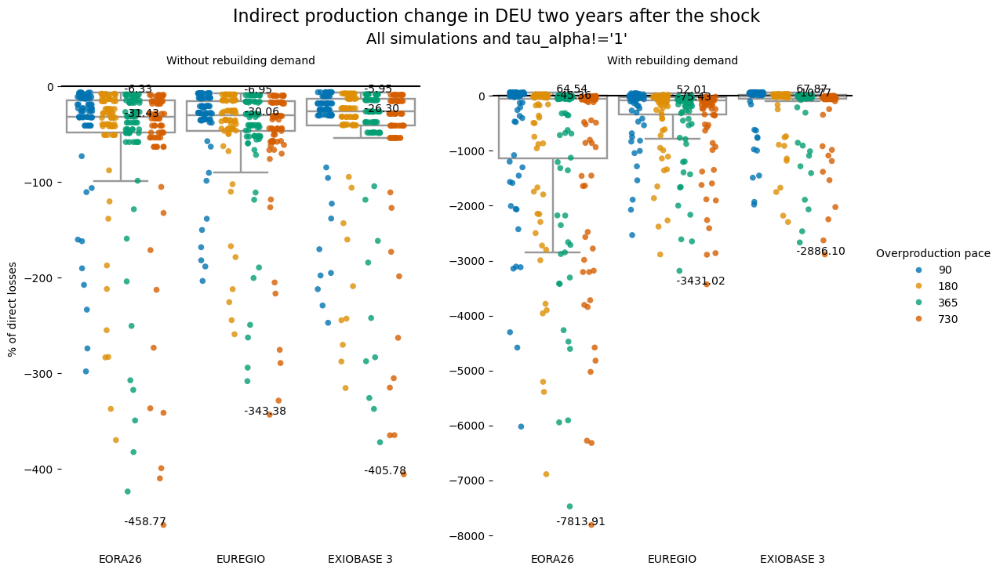

In [80]:
plot_graph(plot_df, var_to_look="value_imp_c", param="Overproduction pace", region=region, sharey=False, trenzcek=False, absurd=True, query="alpha_tau!='1'", hallegatte=False, time_looked="2y", save=False, show_table=False, annotate_values=True)

In [83]:
show_table(plot_df, "value_imp_c", "Recovery length (days)", region, absurd=True, query="alpha_tau!='1'", hallegatte=False, time_looked="2y", precision=1)

In [78]:
show_table(plot_df, "value_imp_c", "alpha_tau", region, absurd=False, query="psi!='1.0' and alpha_tau!='1'", hallegatte=False, time_looked="2y", precision=1)

/tmp/ipykernel_1330410/1802085994.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_overproduction_pace_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_overproduction_pace_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_overproduction_pace_in_DEU_value_imp_c_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (1), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_overproduction_pace_in_DEU_value_imp_c_hallegatte


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_psi_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_psi_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (6), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_psi_in_DEU_value_imp_c_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (1), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_psi_in_DEU_value_imp_c_hallegatte


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_recovery_length_(days)_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_recovery_length_(days)_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_recovery_length_(days)_in_DEU_value_imp_c_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_recovery_length_(days)_in_DEU_value_imp_c_hallegatte


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_mriot_year_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mriot_year_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mriot_year_in_DEU_value_imp_c_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_mriot_year_in_DEU_value_imp_c_hallegatte


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_shortage_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_shortage_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_shortage_in_DEU_value_imp_c_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_shortage_in_DEU_value_imp_c_hallegatte


/home/sjuhel/miniforge3/envs/versa/lib/python3.12/site-packages/seaborn/axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)
/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_mrio_name_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_DEU_value_imp_c


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_DEU_value_imp_c_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/1802085994.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_mrio_name_in_DEU_value_imp_c_hallegatte


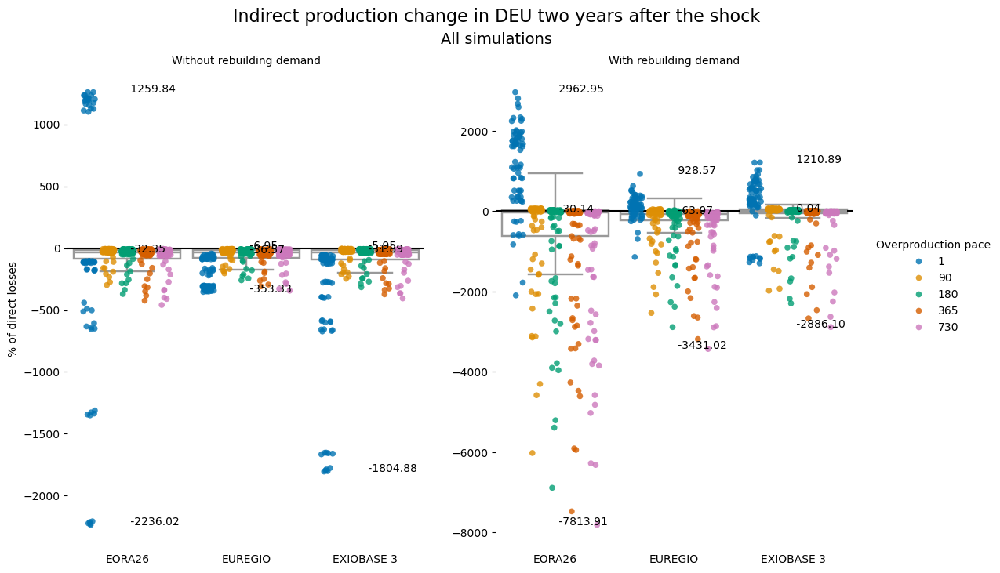

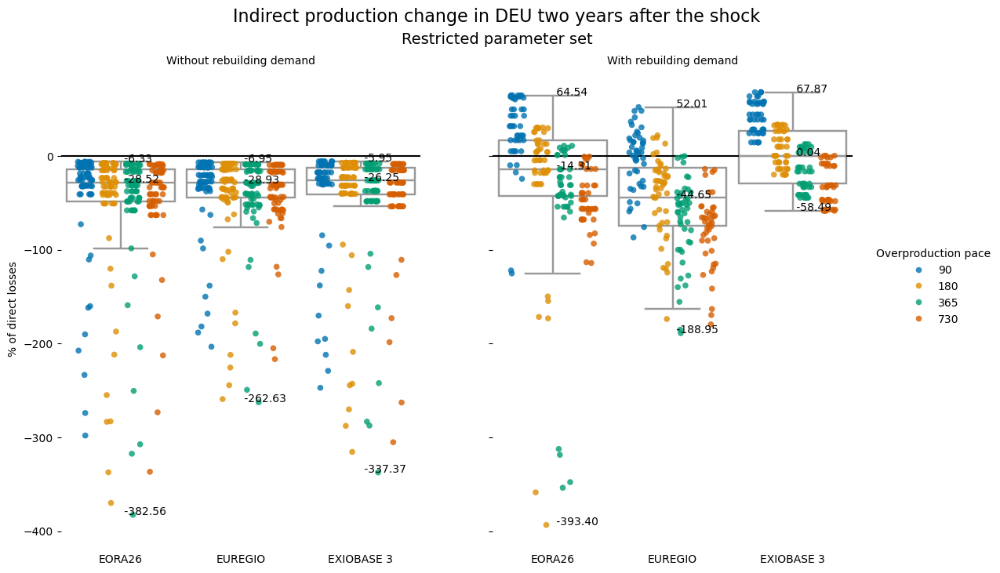

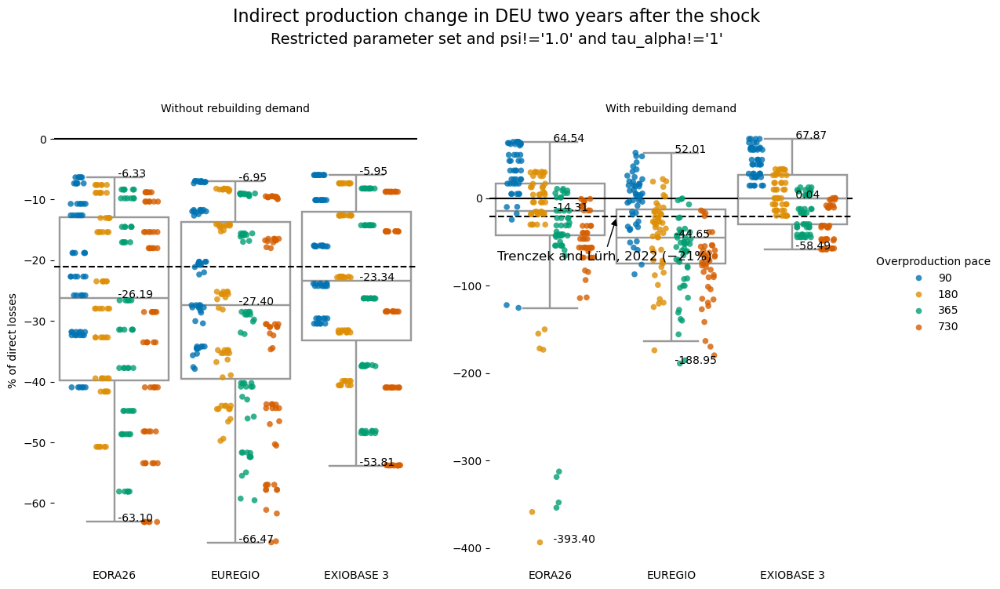

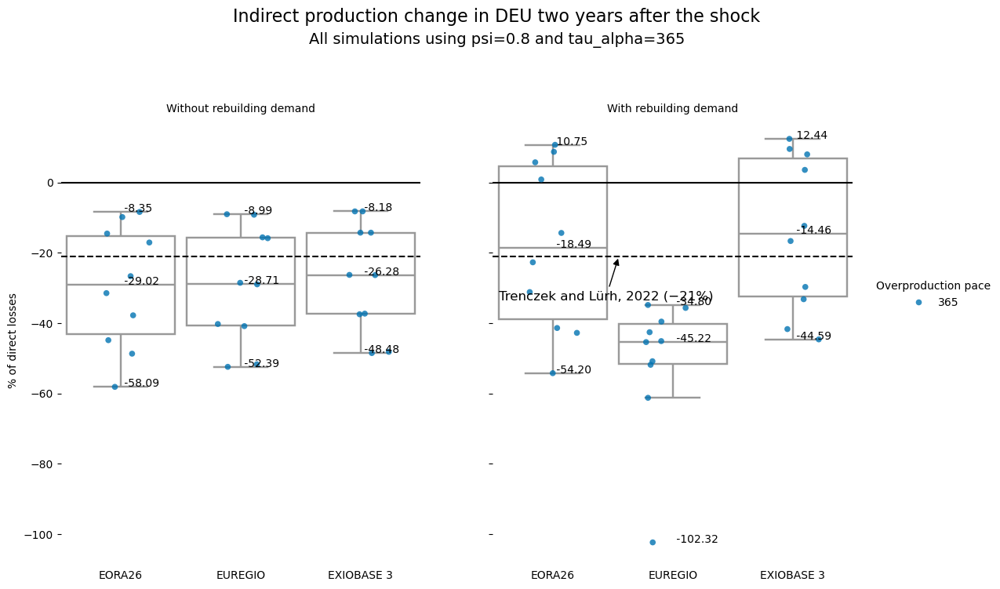

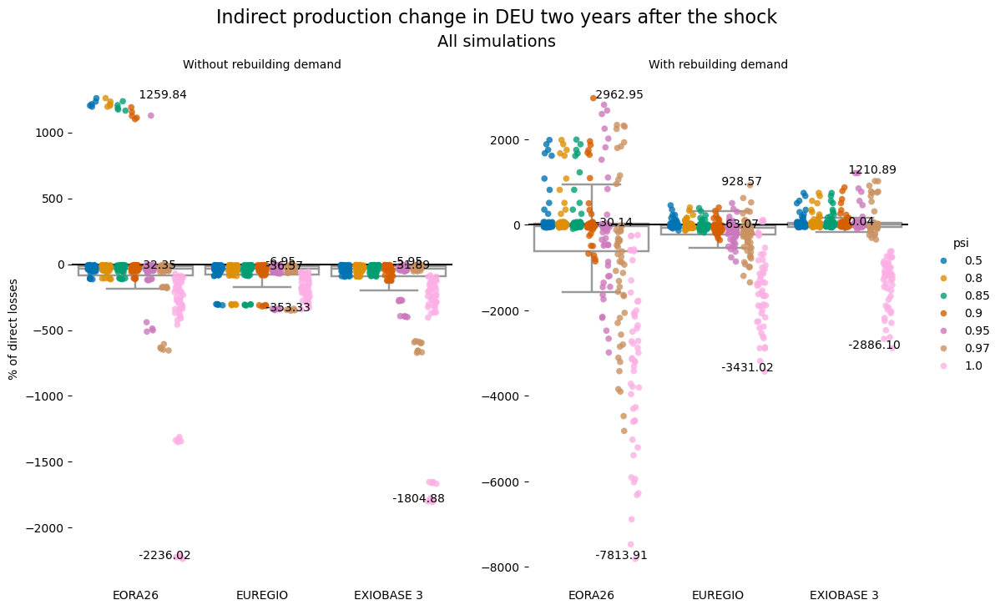

...

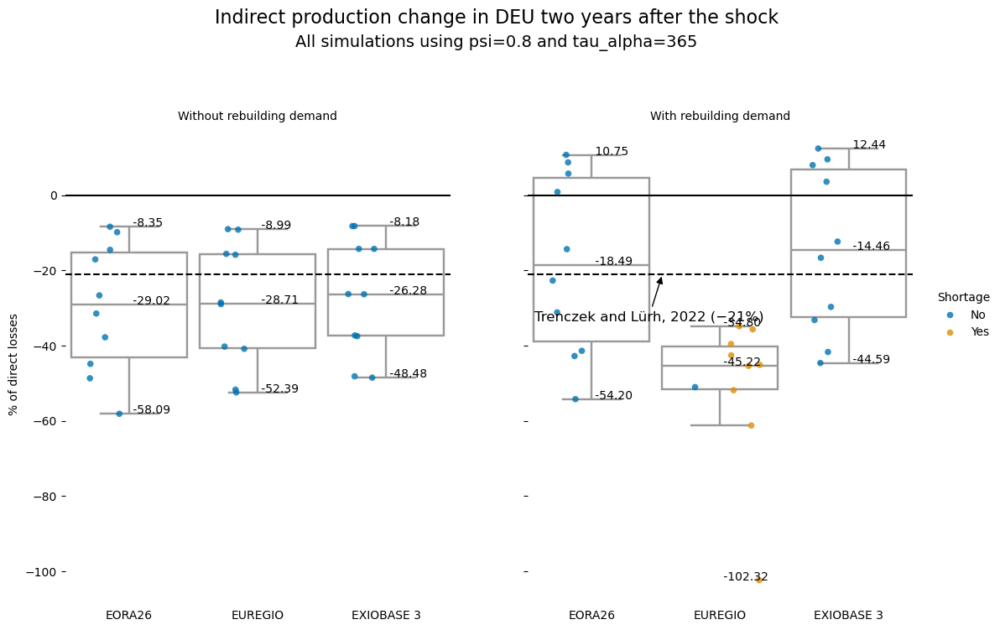

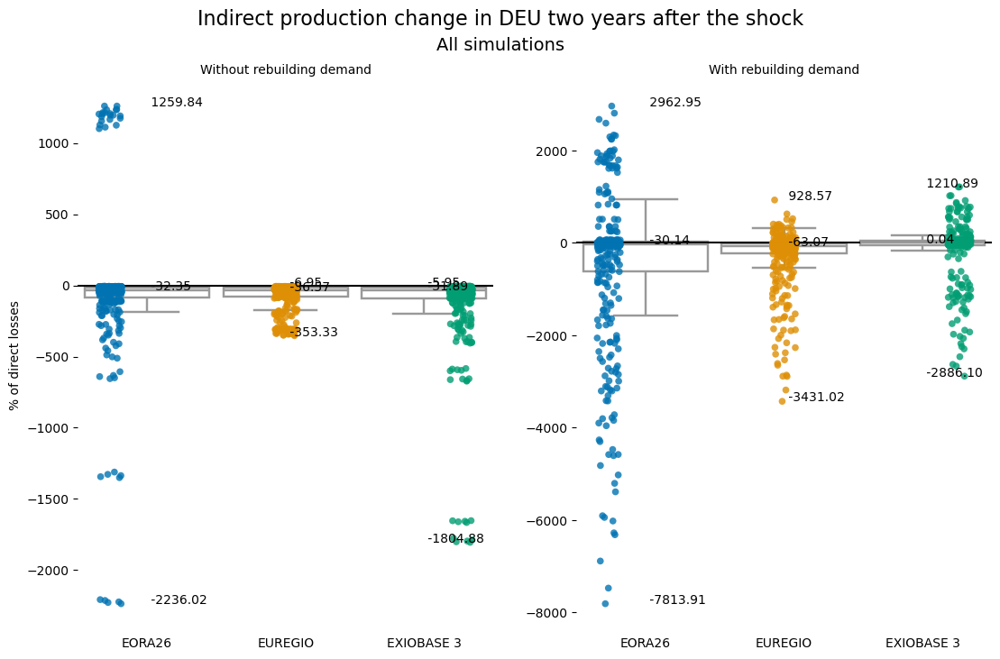

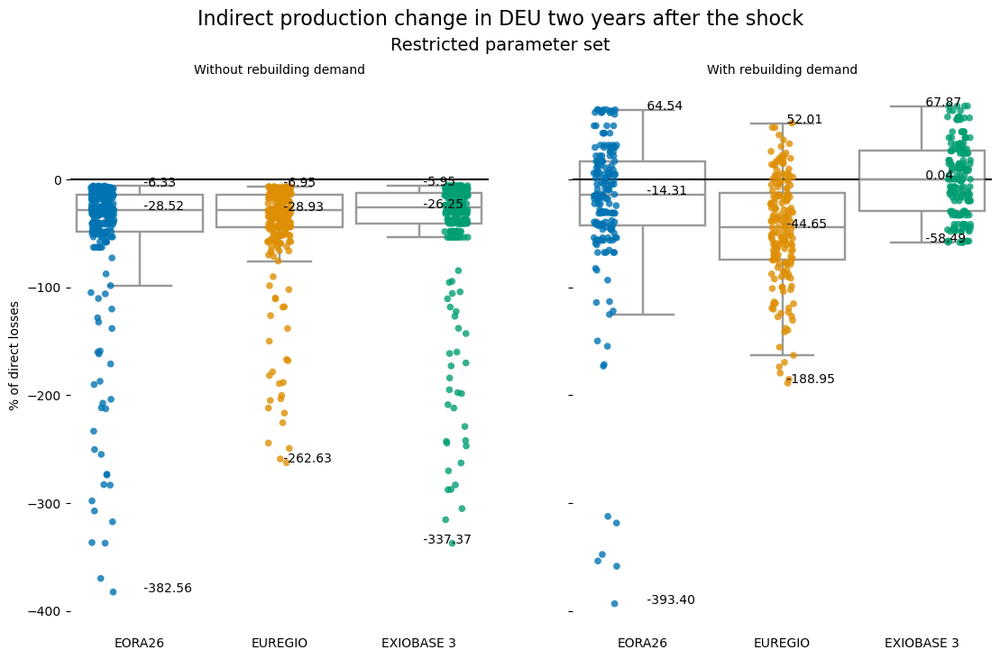

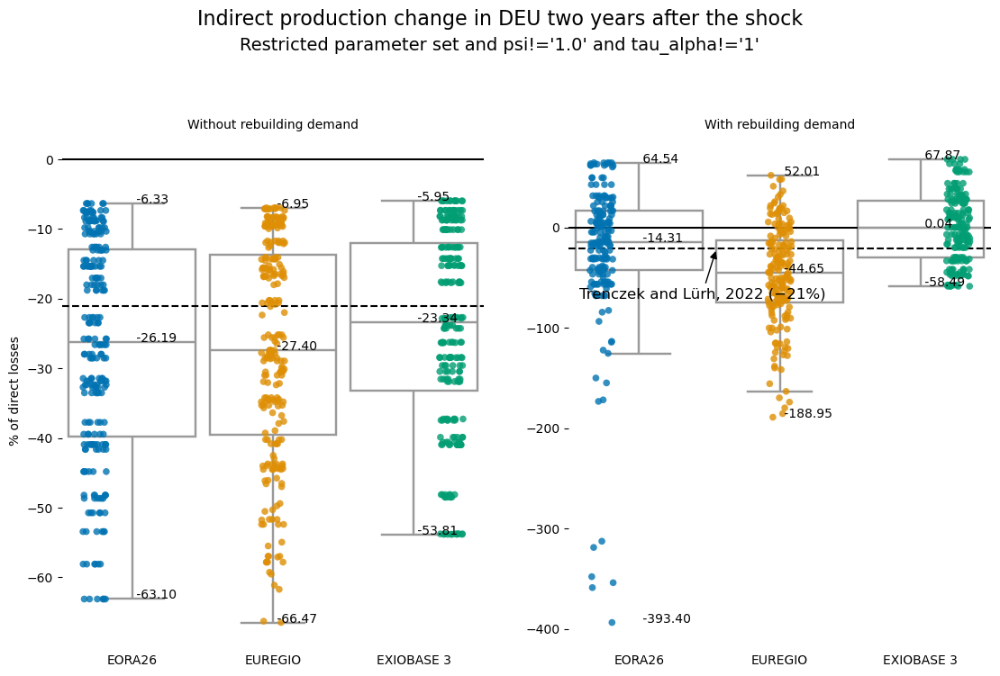

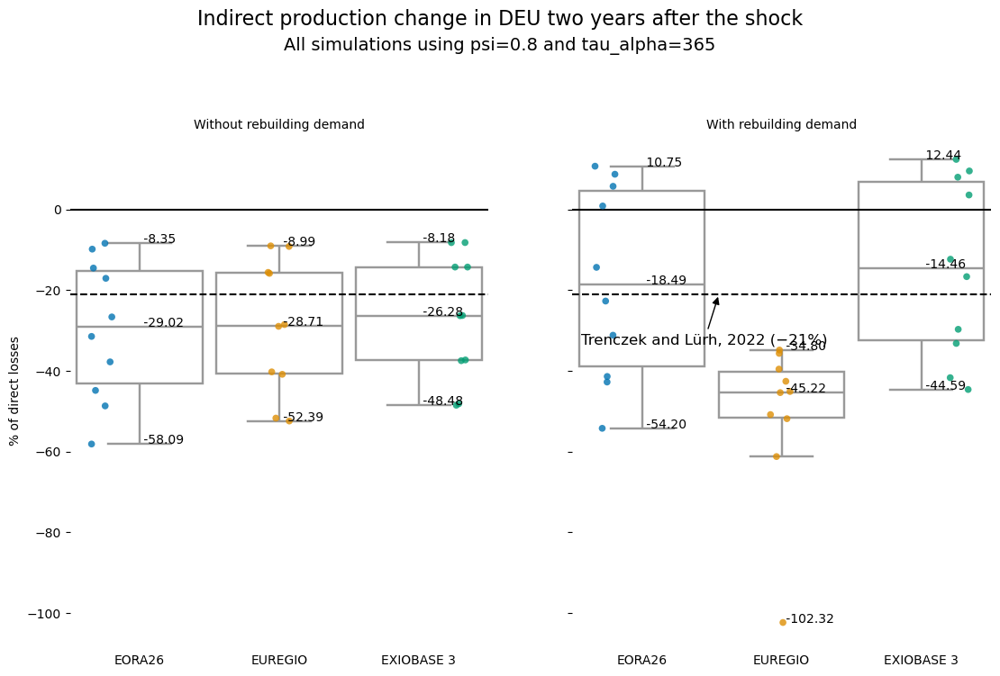

In [73]:
region = 'DEU'
plot_df = pd.read_parquet(f"./parquets_cache/sensitivity_full_sims_{region}_plot_df.parquet")
plot_df = renaming(plot_df)
plt.close()
for param in ["Overproduction pace", "psi", "Recovery length (days)", "MRIOT Year", "Shortage", "mrio_name"]:
    plot_graph(plot_df, var_to_look="value_imp_c", param=param, region=region, sharey=False, trenzcek=False, absurd=True, query=None, hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_graph(plot_df, var_to_look="value_imp_c", param=param, region=region, sharey=True, trenzcek=False, absurd=False, query=None, hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_graph(plot_df, var_to_look="value_imp_c", param=param, region=region, sharey=False, trenzcek=True, absurd=False, query="psi!='1.0' and alpha_tau!='1'", hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_graph(plot_df, var_to_look="value_imp_c", param=param, region=region, sharey=True, trenzcek=True, absurd=True, query=None, hallegatte=True, time_looked="2y", save=True, show_table=False, annotate_values=True)

#### By sector

/tmp/ipykernel_1330410/3906534635.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_DEU_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


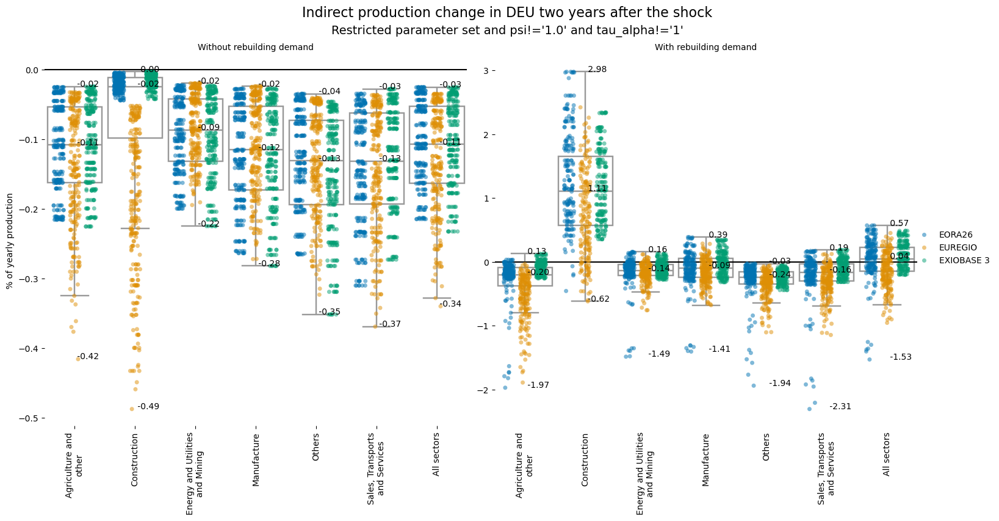

In [62]:
region = 'DEU'
plot_df = pd.read_parquet(f"./parquets_cache/sensitivity_full_sims_{region}_plot_df.parquet")
plot_df = renaming(plot_df)
param="mrio_name"
plot_sector_boxplot(plot_df, region, param, sharey=False, absurd=False, query="psi!='1.0' and alpha_tau!='1'", hallegatte=False, time_looked="2y", save=True, show_table=True, annotate_values=True)

/tmp/ipykernel_1330410/3906534635.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  graph = sns.catplot(


Saving per_sectors_influence_of_overproduction_pace_in_DEU_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_overproduction_pace_in_DEU_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_overproduction_pace_in_DEU_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_overproduction_pace_in_DEU_value_cumsum_pct_hallegatte


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  graph = sns.catplot(


Saving per_sectors_influence_of_psi_in_DEU_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_psi_in_DEU_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (6), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_psi_in_DEU_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (7), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_psi_in_DEU_value_cumsum_pct_hallegatte


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  graph = sns.catplot(


Saving per_sectors_influence_of_recovery_length_(days)_in_DEU_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_recovery_length_(days)_in_DEU_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_recovery_length_(days)_in_DEU_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_recovery_length_(days)_in_DEU_value_cumsum_pct_hallegatte


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving per_sectors_influence_of_mriot_year_in_DEU_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mriot_year_in_DEU_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mriot_year_in_DEU_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mriot_year_in_DEU_value_cumsum_pct_hallegatte


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving per_sectors_influence_of_mrio_name_in_DEU_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_DEU_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_DEU_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_DEU_value_cumsum_pct_hallegatte


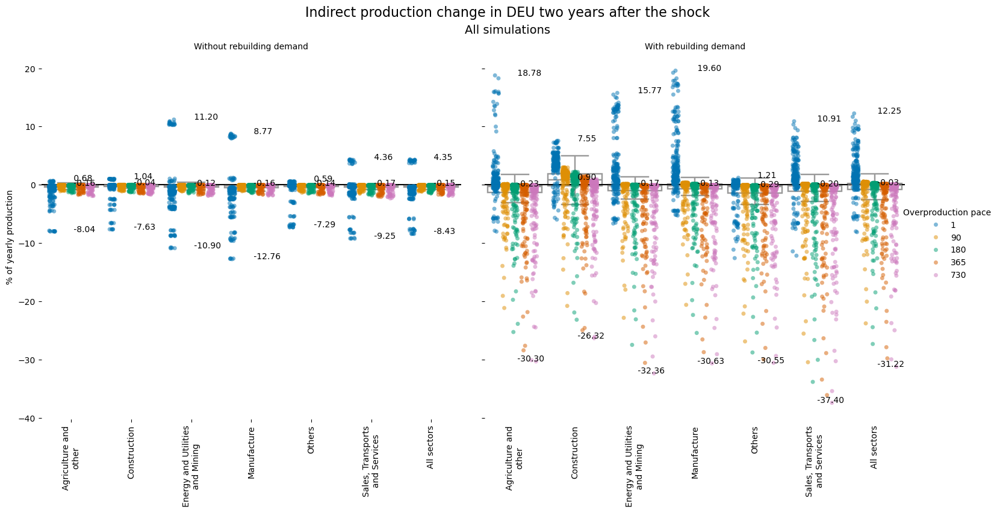

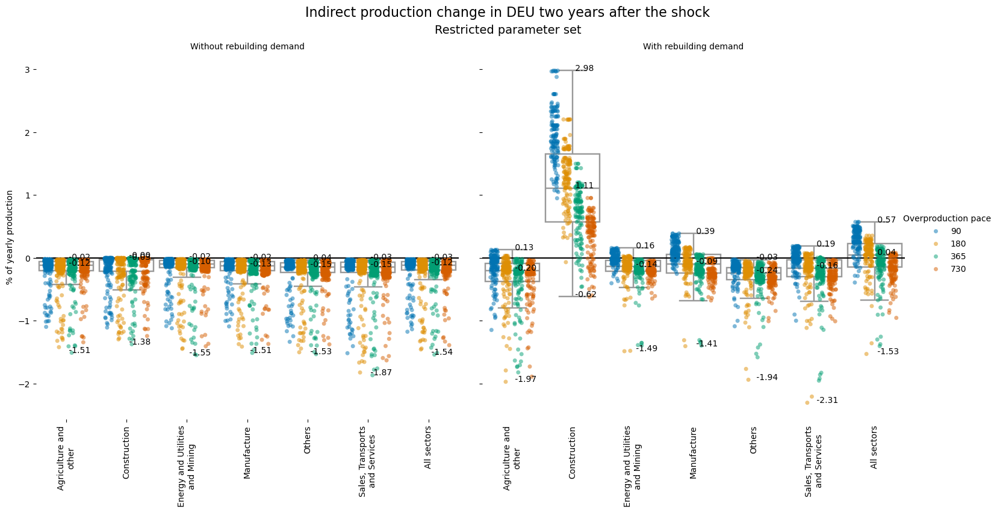

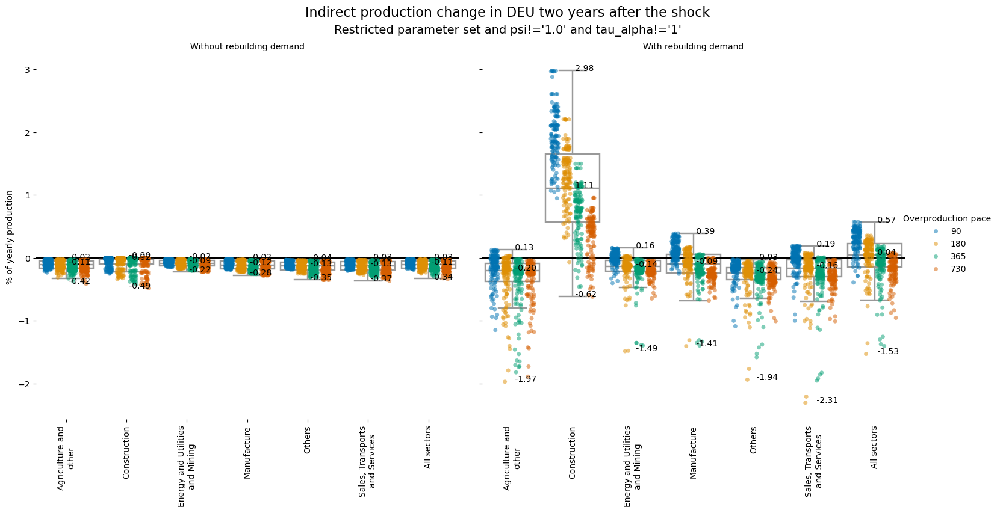

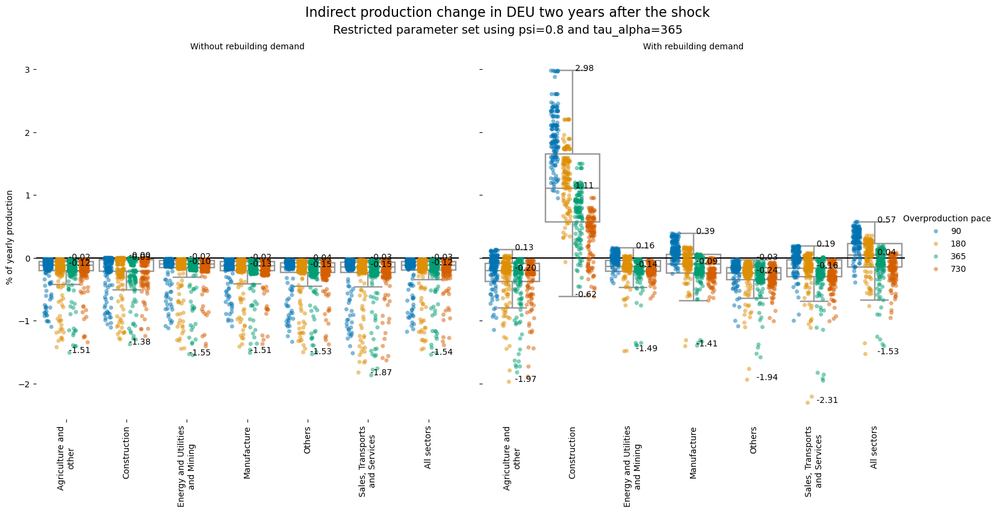

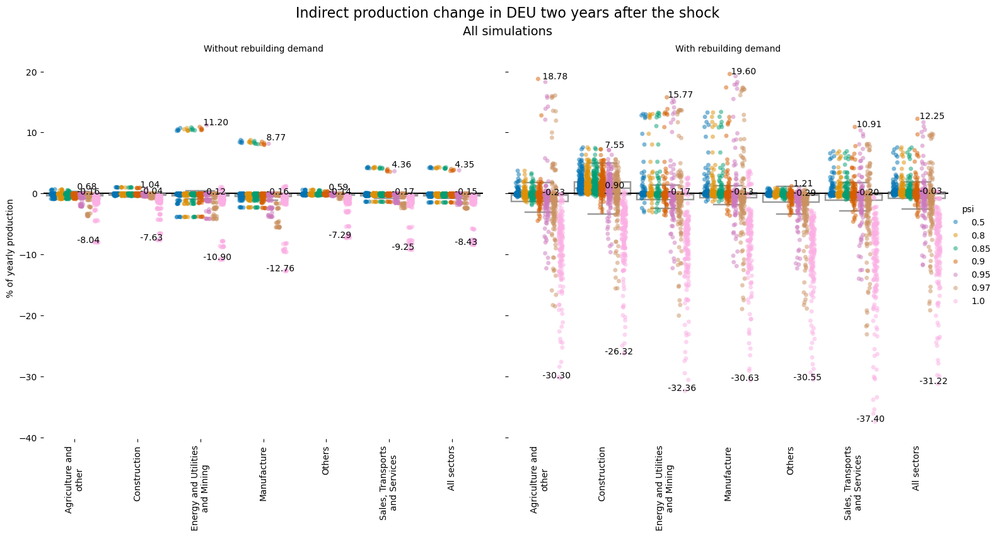

...

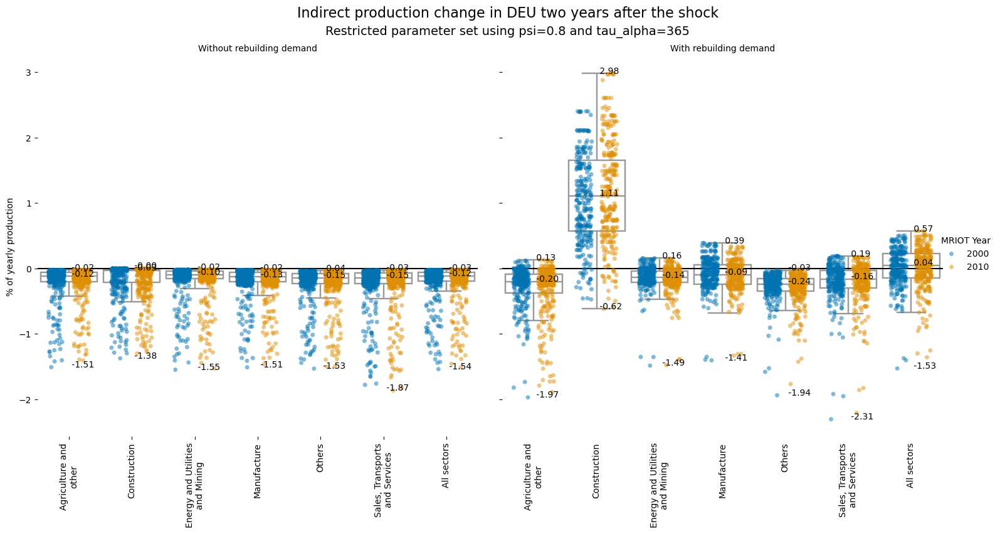

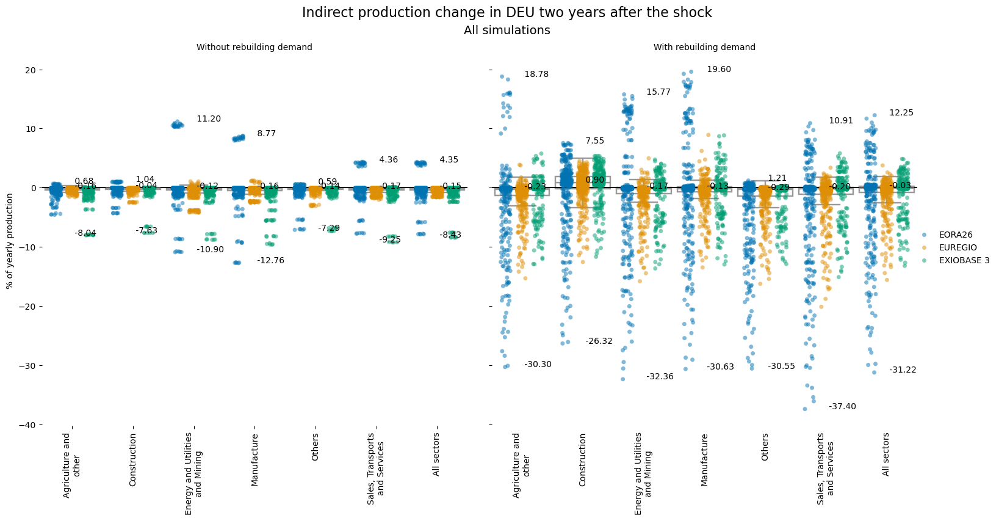

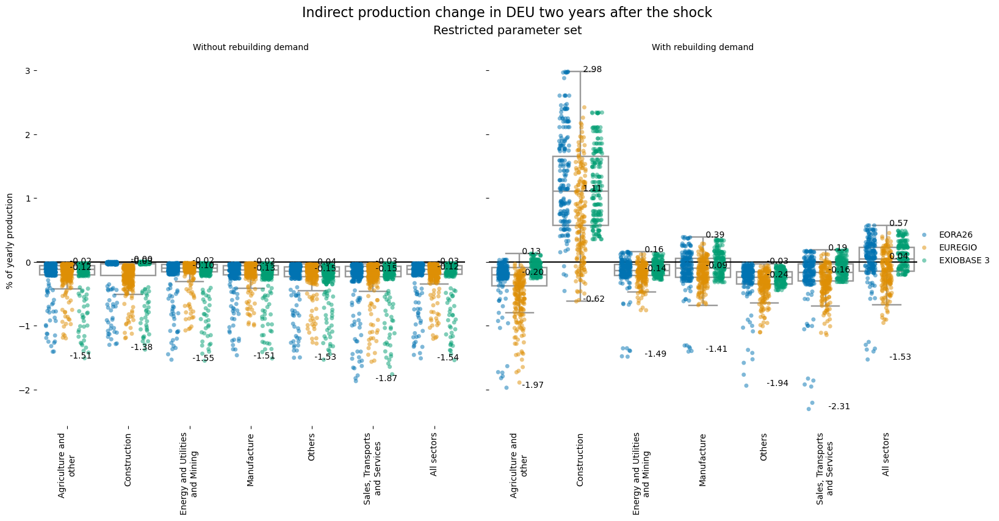

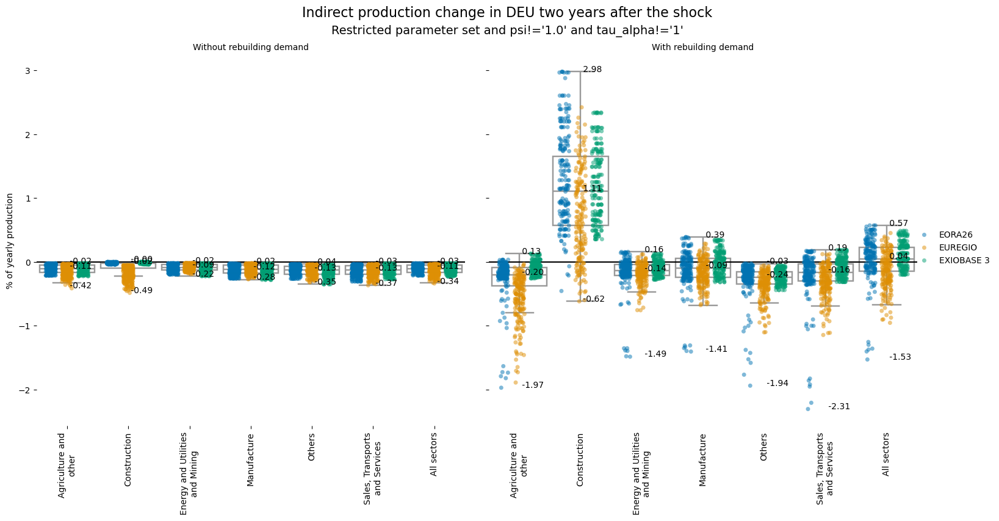

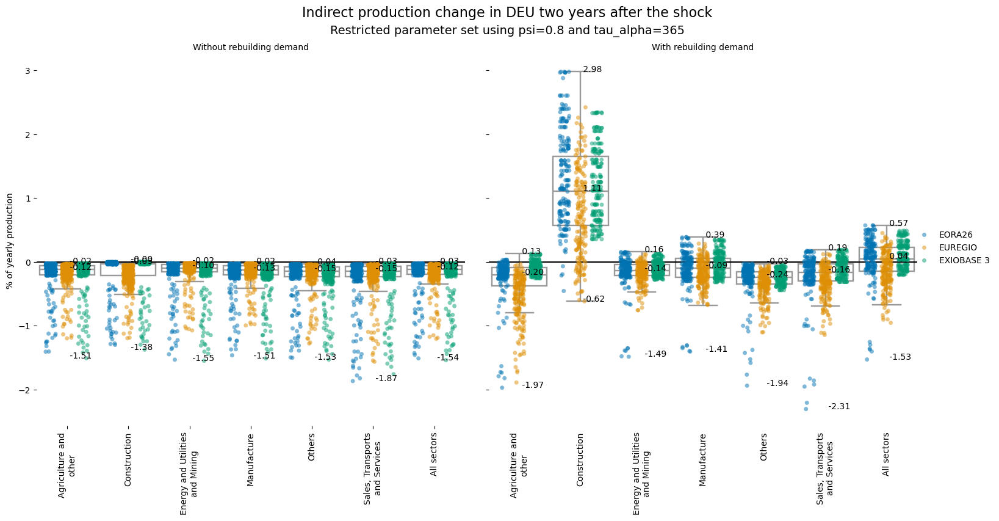

In [ ]:
plt.close()
region = 'DEU'
plot_df = pd.read_parquet(f"./parquets_cache/sensitivity_full_sims_{region}_plot_df.parquet")
plot_df = renaming(plot_df)
for param in ["Overproduction pace", "psi", "Recovery length (days)", "MRIOT Year", "mrio_name"]:
    plot_sector_boxplot(plot_df, region, param, sharey=True, absurd=True, query=None, hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_sector_boxplot(plot_df, region, param, sharey=True, absurd=False, query=None, hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_sector_boxplot(plot_df, region, param, sharey=True, absurd=False, query="psi!='1.0' and alpha_tau!='1'", hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_sector_boxplot(plot_df, region, param, sharey=True, absurd=False, query=None, hallegatte=True, time_looked="2y", save=True, show_table=False, annotate_values=True)

### By country

#### Aggregated

/tmp/ipykernel_1330410/1756522591.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_mrio_name_in_FRA_value_cumsum_pct


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_FRA_value_cumsum_pct


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_FRA_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_FRA_value_cumsum_pct_hallegatte


/tmp/ipykernel_1330410/1756522591.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_mrio_name_in_ROW_value_cumsum_pct


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_ROW_value_cumsum_pct


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_ROW_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_ROW_value_cumsum_pct_hallegatte


/tmp/ipykernel_1330410/1756522591.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_mrio_name_in_USA_value_cumsum_pct


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_USA_value_cumsum_pct


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_USA_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_USA_value_cumsum_pct_hallegatte


/tmp/ipykernel_1330410/1756522591.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving aggregated_influence_of_mrio_name_in_CHN_value_cumsum_pct


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_CHN_value_cumsum_pct


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_CHN_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/1756522591.py:536: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_aggregated_influence_of_mrio_name_in_CHN_value_cumsum_pct_hallegatte


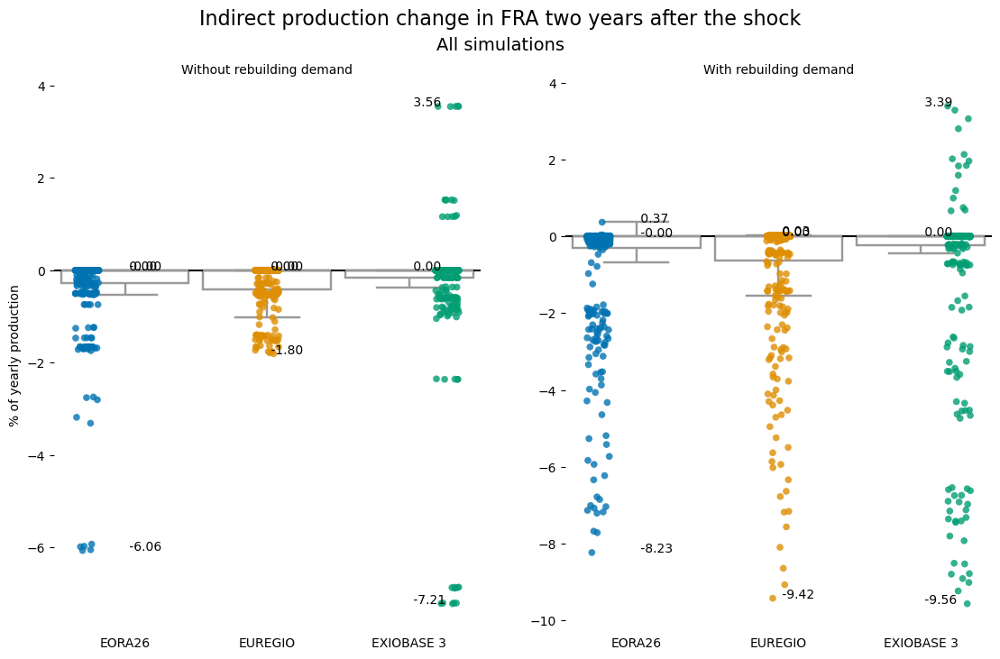

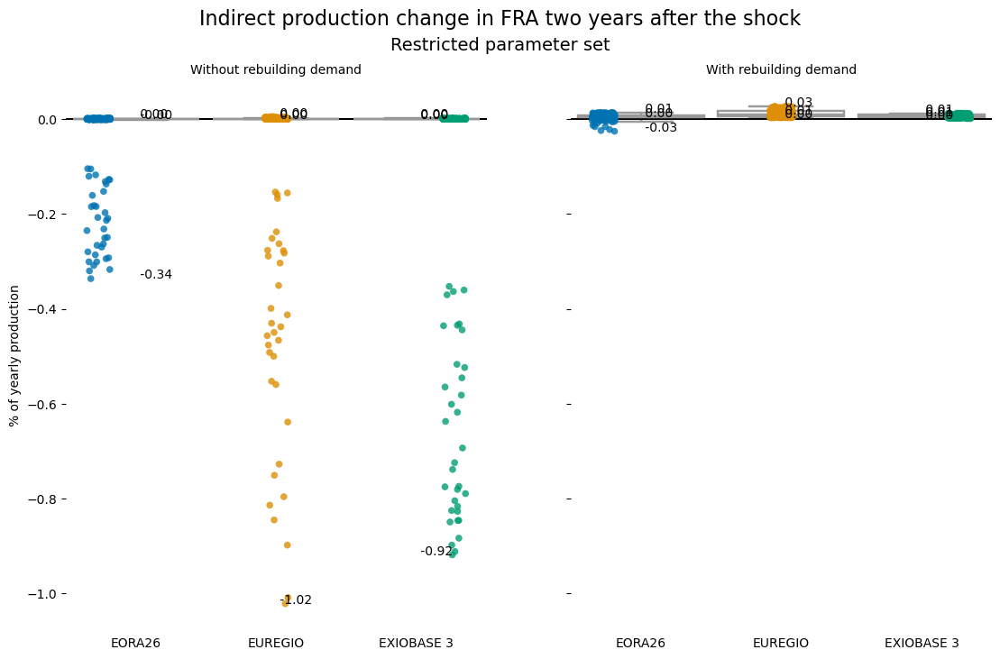

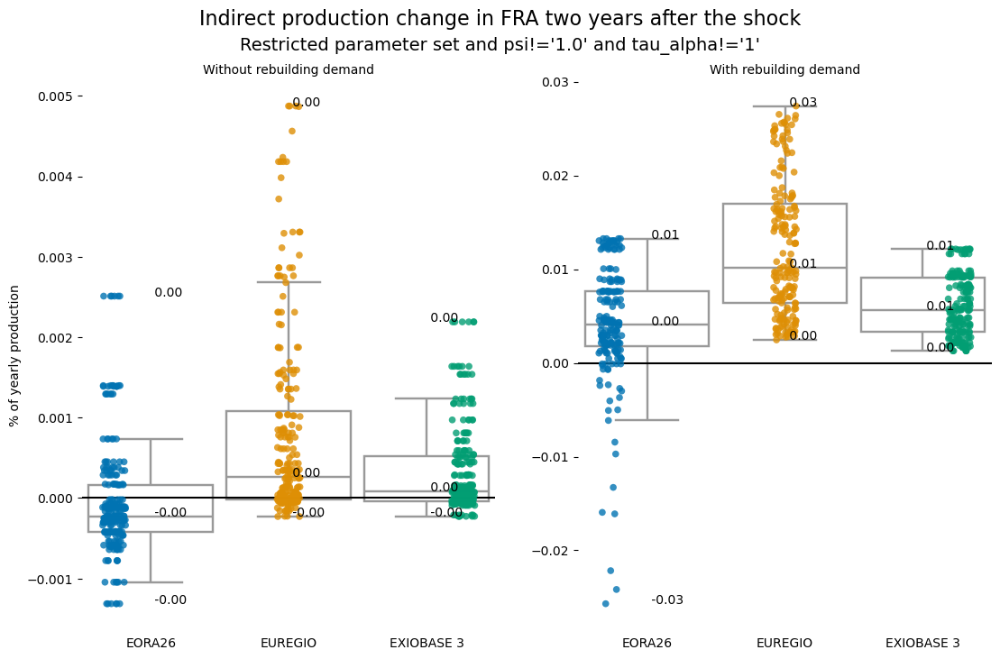

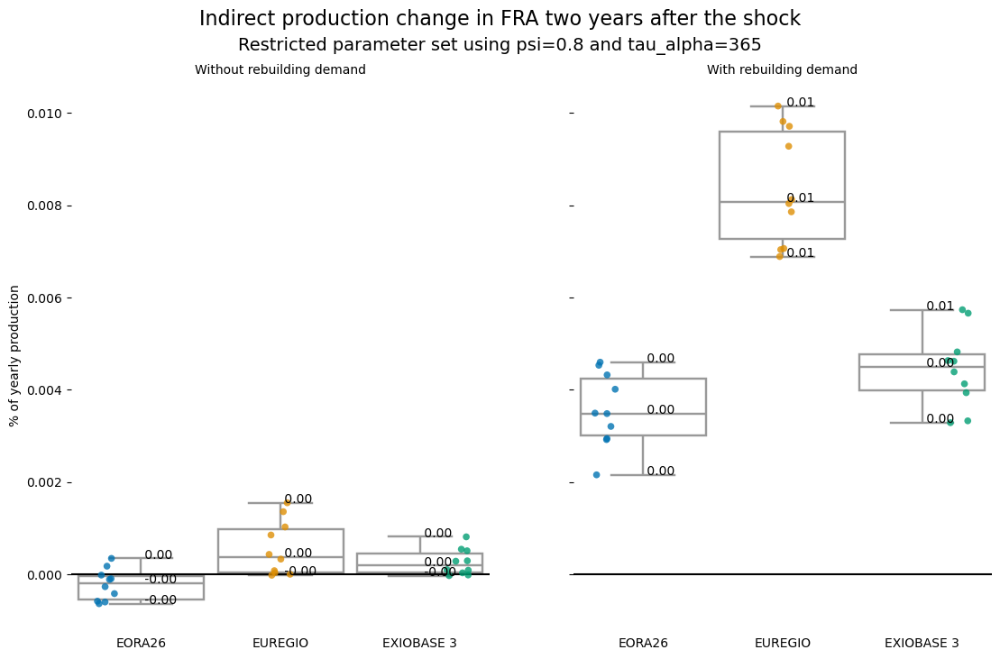

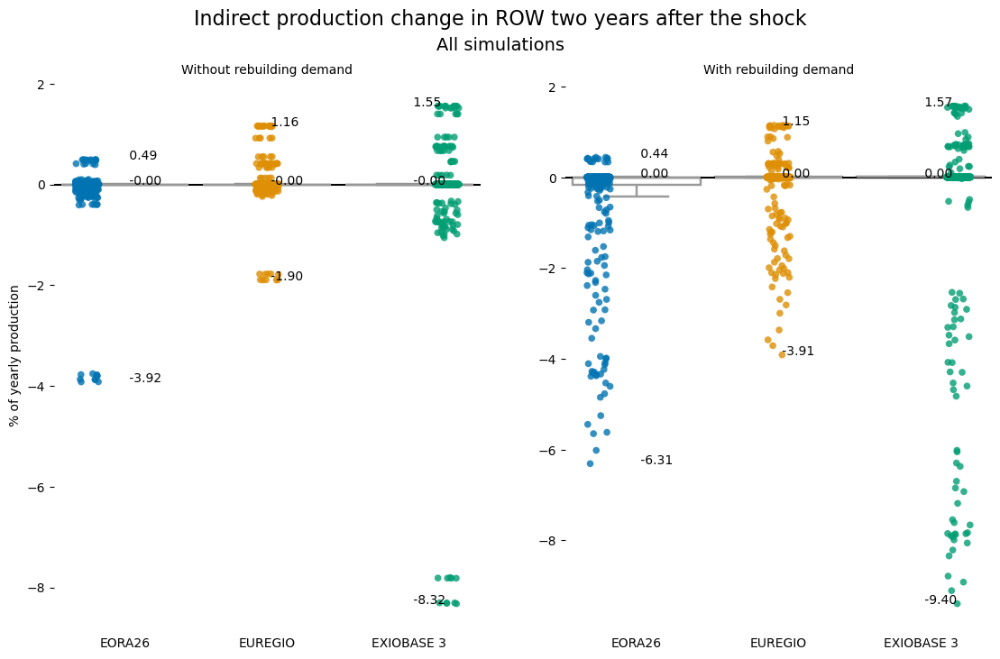

...

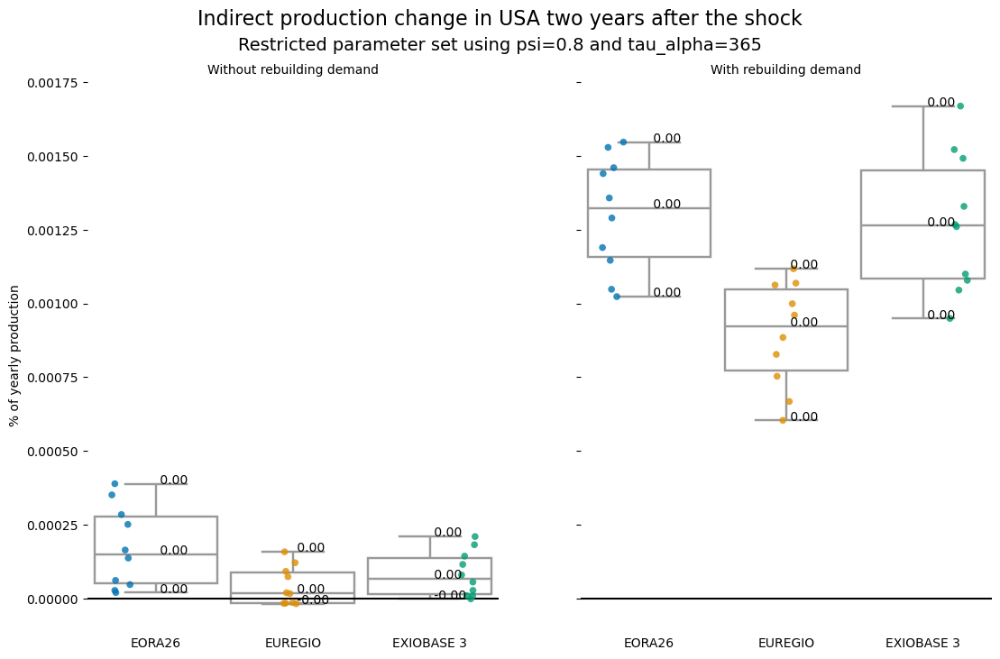

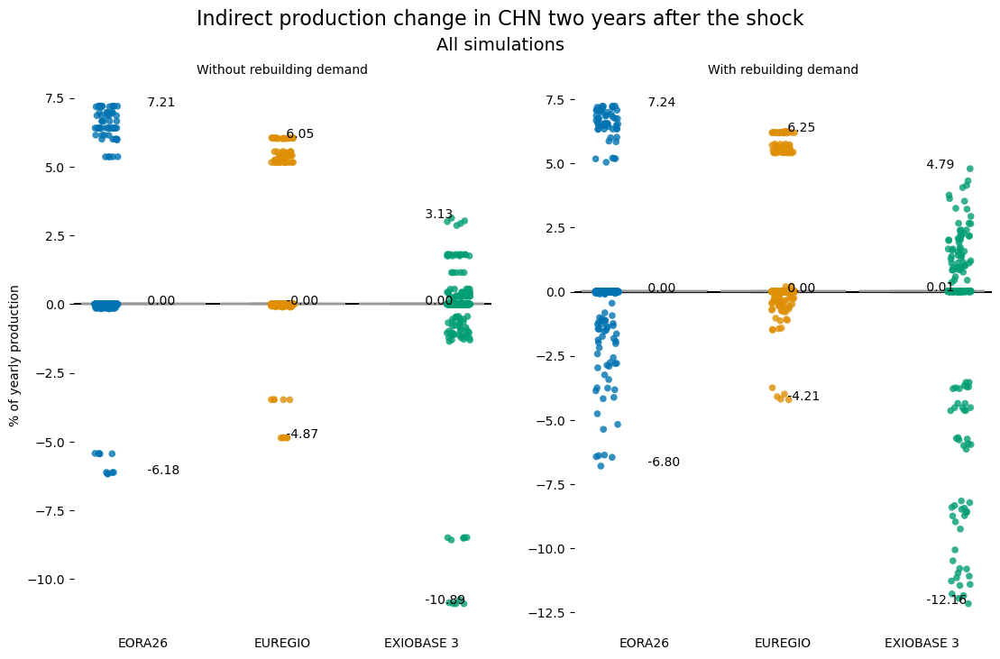

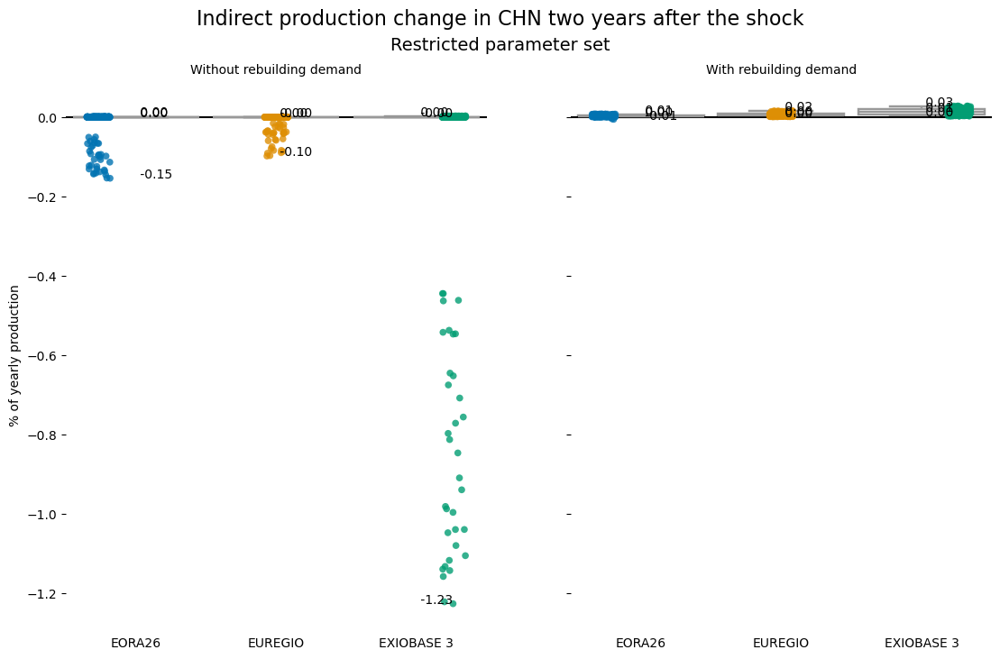

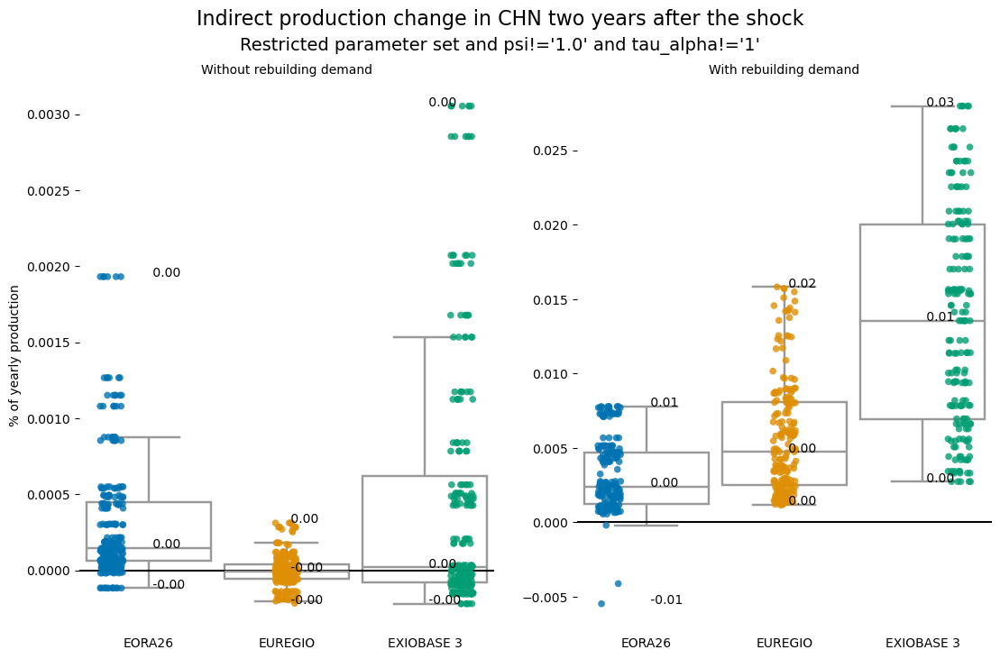

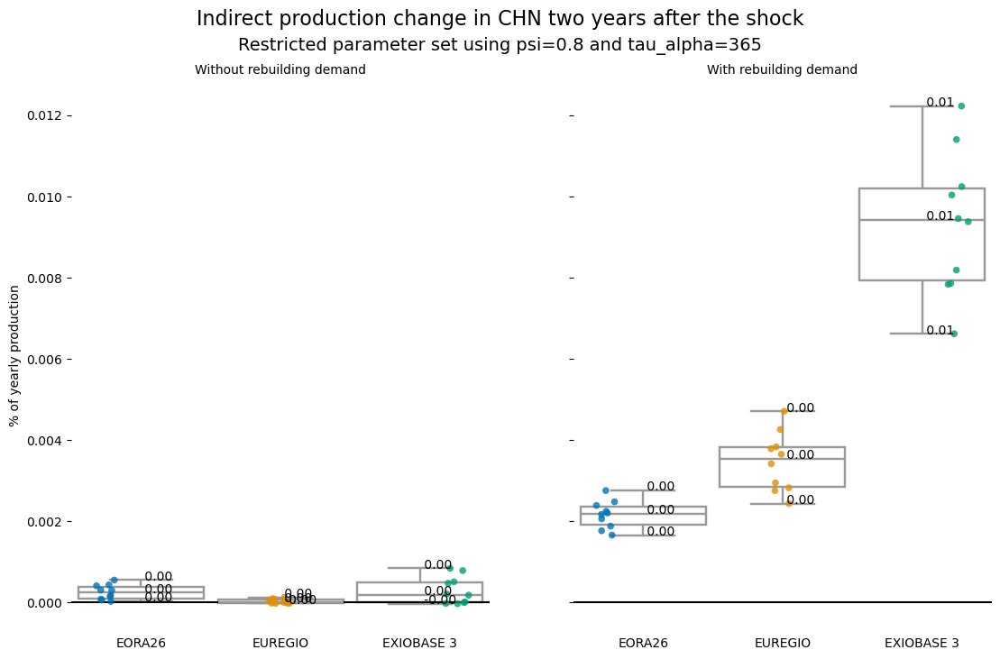

In [86]:
plt.close()
param = "mrio_name"
for region in ["FRA","ROW","USA","CHN"]:
    plot_df = pd.read_parquet(f"./parquets_cache/sensitivity_full_sims_{region}_plot_df.parquet")
    plot_df = renaming(plot_df)
    plot_graph(plot_df, var_to_look="value_cumsum_pct", param=param, region=region, sharey=False, trenzcek=False, absurd=True, query=None, hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_graph(plot_df, var_to_look="value_cumsum_pct", param=param, region=region, sharey=True, trenzcek=False, absurd=False, query=None, hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_graph(plot_df, var_to_look="value_cumsum_pct", param=param, region=region, sharey=False, trenzcek=False, absurd=False, query="psi!='1.0' and alpha_tau!='1'", hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_graph(plot_df, var_to_look="value_cumsum_pct", param=param, region=region, sharey=True, trenzcek=False, absurd=False, query=None, hallegatte=True, time_looked="2y", save=True, show_table=False, annotate_values=True)

#### By sector

/tmp/ipykernel_1330410/3906534635.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving per_sectors_influence_of_mrio_name_in_FRA_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_FRA_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_FRA_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_FRA_value_cumsum_pct_hallegatte


/tmp/ipykernel_1330410/3906534635.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving per_sectors_influence_of_mrio_name_in_ROW_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_ROW_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_ROW_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_ROW_value_cumsum_pct_hallegatte


/tmp/ipykernel_1330410/3906534635.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving per_sectors_influence_of_mrio_name_in_USA_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_USA_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_USA_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_USA_value_cumsum_pct_hallegatte


/tmp/ipykernel_1330410/3906534635.py:505: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  plot_df["Recovery length (days)"] = plot_df.length.replace({
/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving per_sectors_influence_of_mrio_name_in_CHN_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_CHN_value_cumsum_pct


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_CHN_value_cumsum_pct_psi_neq_1_0_and_alpha_tau_neq_1


/tmp/ipykernel_1330410/3906534635.py:642: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  graph = sns.catplot(


Saving no_outliers_per_sectors_influence_of_mrio_name_in_CHN_value_cumsum_pct_hallegatte


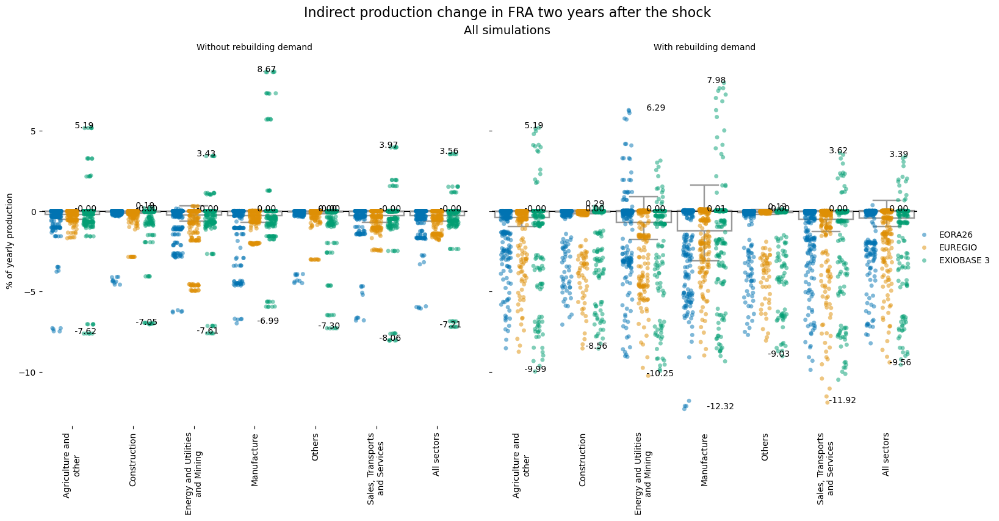

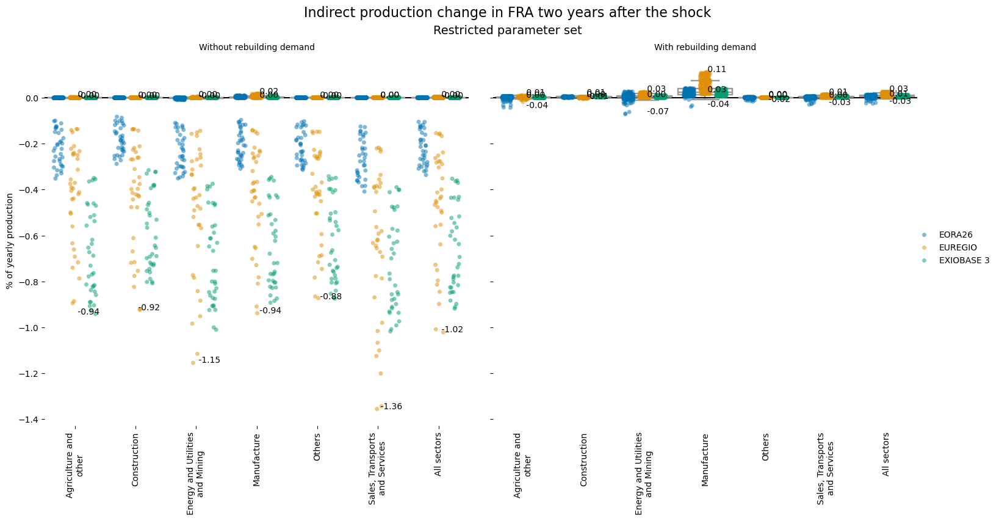

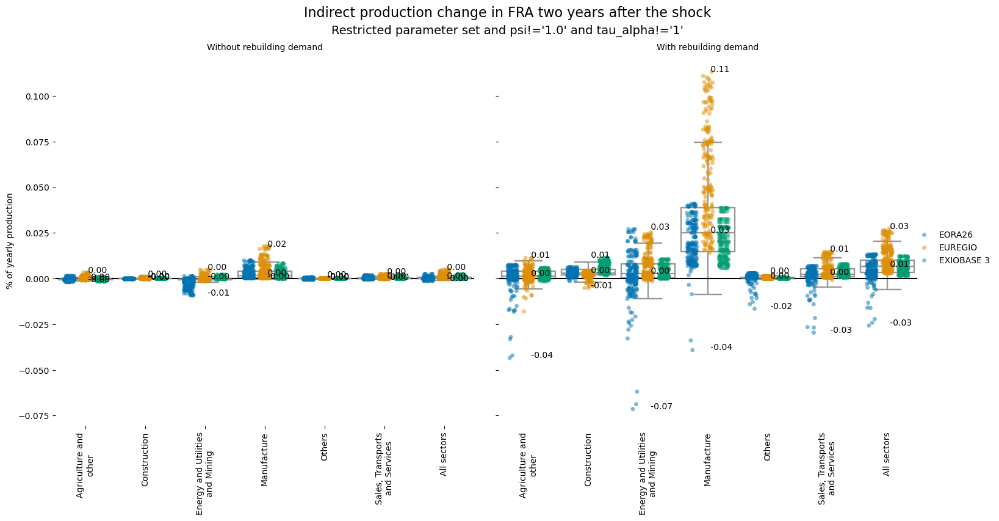

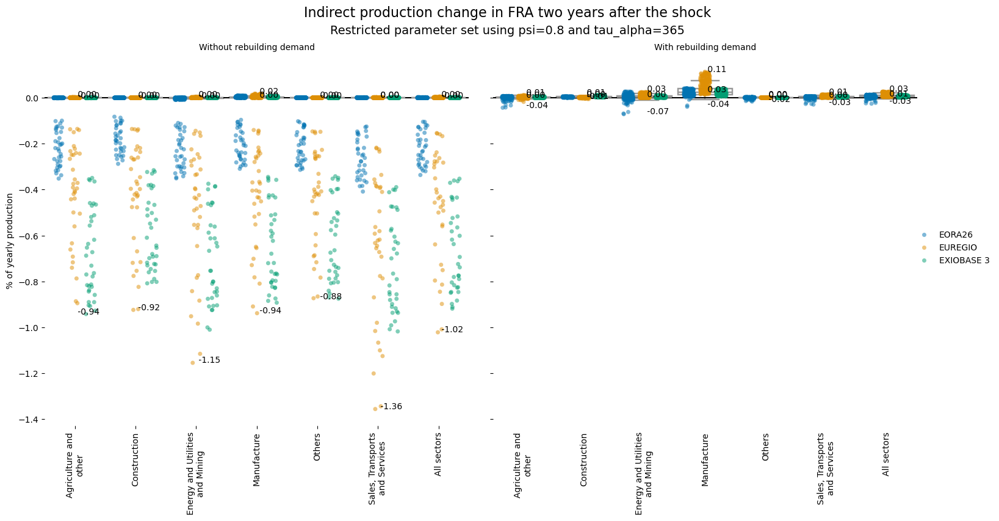

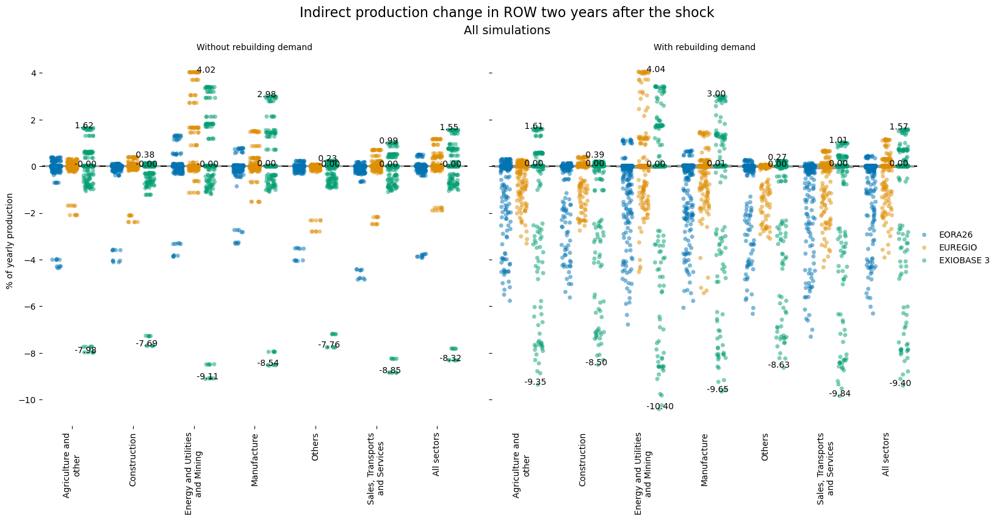

...

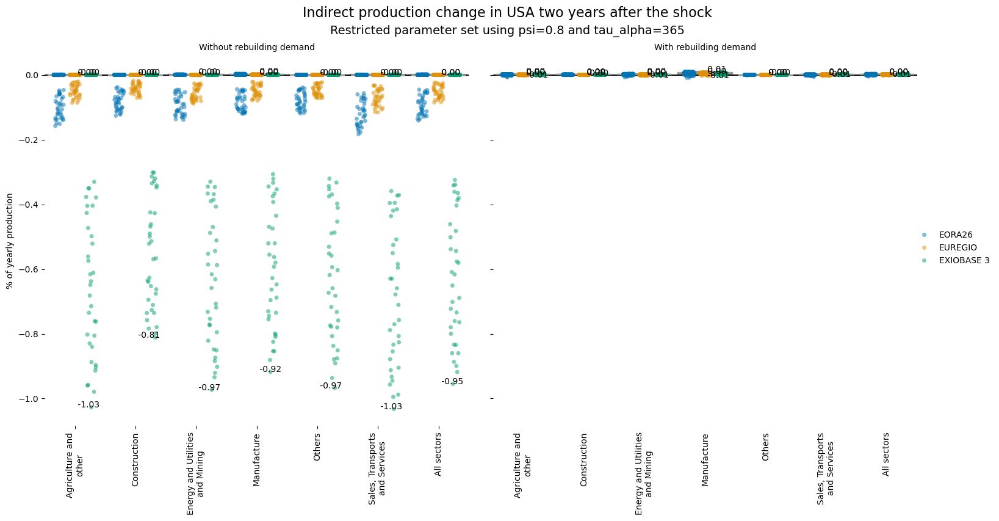

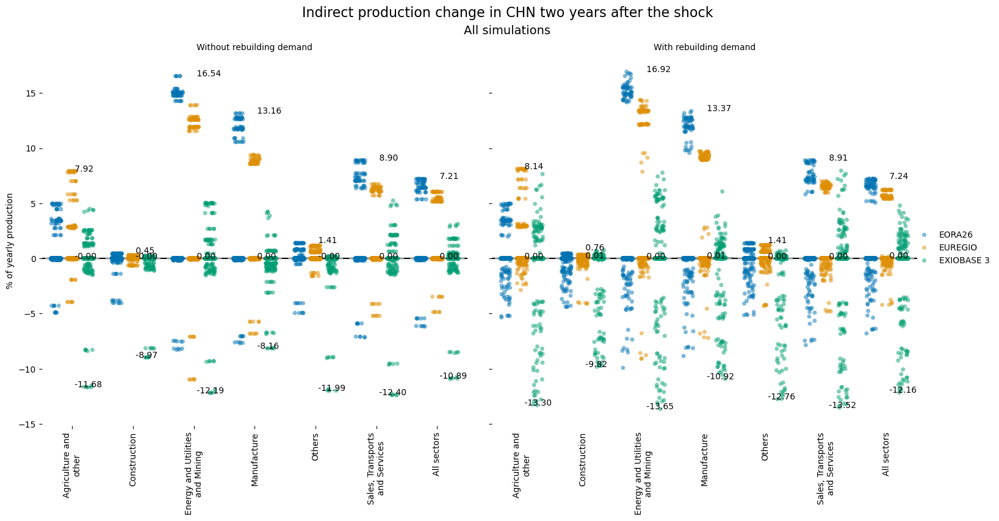

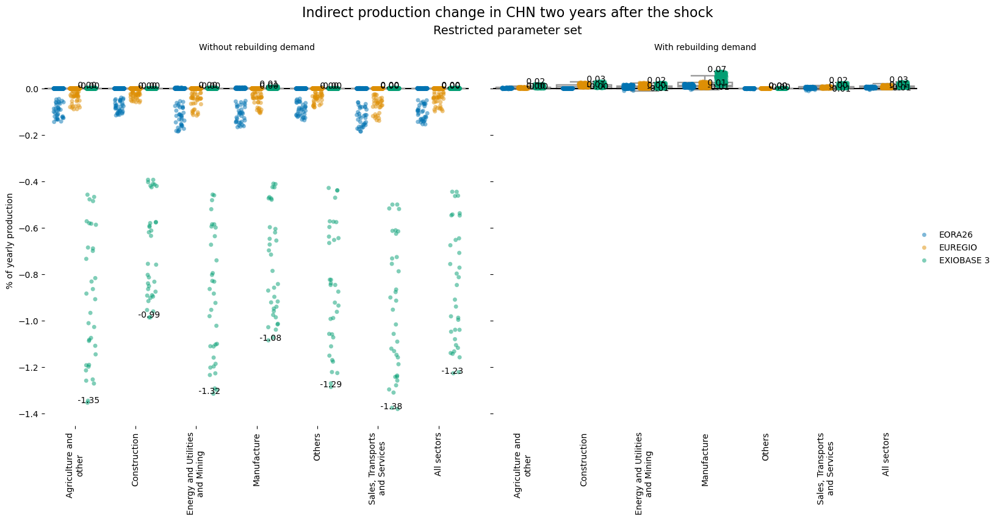

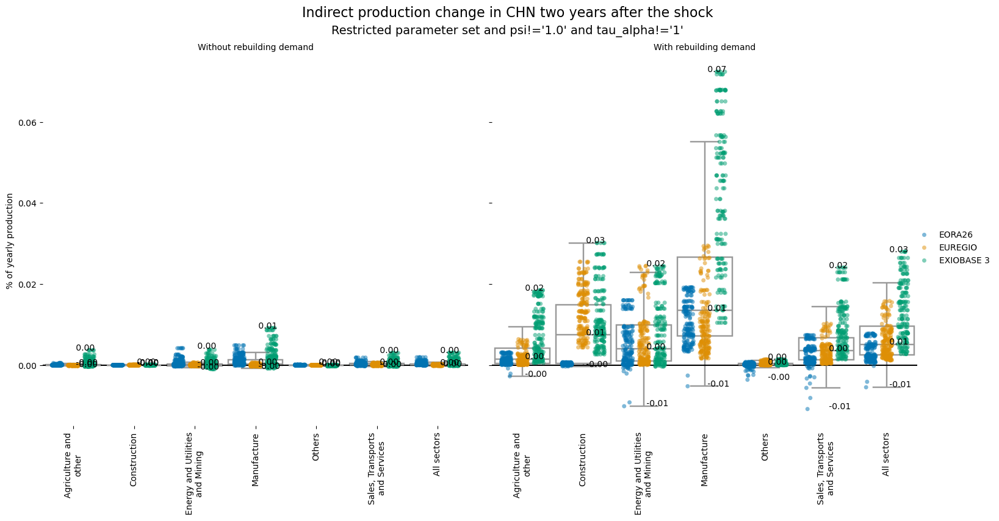

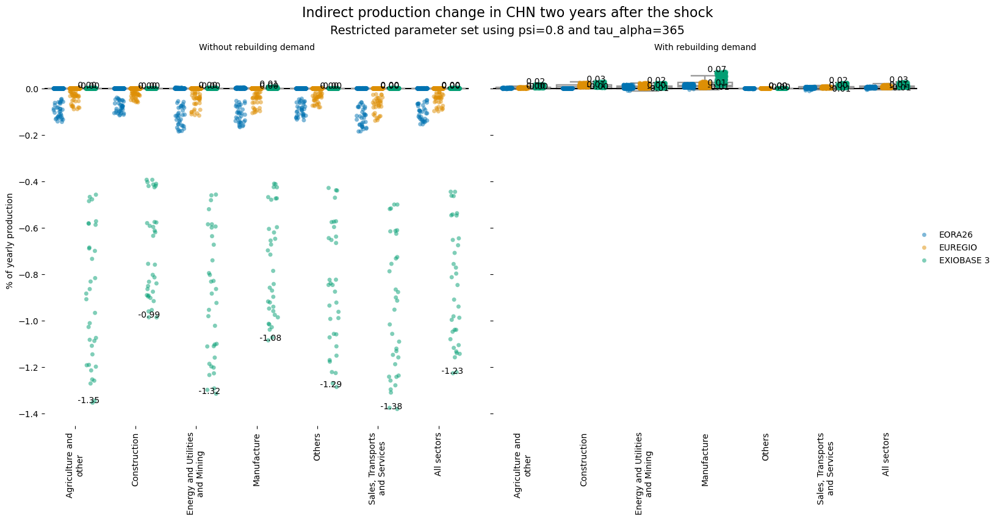

In [55]:
plt.close()
param = "mrio_name"
for region in ["FRA","ROW","USA","CHN"]:
    plot_df = pd.read_parquet(f"./parquets_cache/sensitivity_full_sims_{region}_plot_df.parquet")
    plot_df = renaming(plot_df)
    plot_sector_boxplot(plot_df, region, param, sharey=True, absurd=True, query=None, hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_sector_boxplot(plot_df, region, param, sharey=True, absurd=False, query=None, hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_sector_boxplot(plot_df, region, param, sharey=True, absurd=False, query="psi!='1.0' and alpha_tau!='1'", hallegatte=False, time_looked="2y", save=True, show_table=False, annotate_values=True)
    plot_sector_boxplot(plot_df, region, param, sharey=True, absurd=False, query=None, hallegatte=True, time_looked="2y", save=True, show_table=False, annotate_values=True)

### Scratch

In [26]:
df = pd.read_parquet(f"./parquets_cache/sensitivity_full_sims_DEU_full_df.parquet")

In [13]:
df.loc[(df["Experience"]=="reclin3M~0.5~1~eora26_2000_full") & (df["region"]=="DEU") & (df["step"]==730)]

,variable,region,sector,step,value,Experience,value_pct,value_cumsum_pct,max_neg_impact_value_pct,max_neg_impact_class,max_pos_impact_value_pct,max_pos_impact_class,mean_impact_value_pct,mean_impact_class,cumsum_pct_min,cumsum_impact_class
15330000,production_realised,DEU,Agriculture and other,730,124.716996,reclin3M~0.5~1~eora26_2000_full,-0.291888,-0.439102,-0.75285,1L0_5,24.910256,20G25,0.453358,no_losses,-1.885882,2L1_5
17629500,production_realised,DEU,Construction,730,604.337710,reclin3M~0.5~1~eora26_2000_full,-0.044098,-0.064218,-0.75285,1L0_5,24.910256,20G25,0.453358,no_losses,-1.885882,2L1_5
19929000,production_realised,DEU,Energy and Utilities and Mining,730,204.069765,reclin3M~0.5~1~eora26_2000_full,-0.729273,-1.124976,-0.75285,1L0_5,24.910256,20G25,0.453358,no_losses,-1.885882,2L1_5
22228500,production_realised,DEU,Manufacture,730,3276.903214,reclin3M~0.5~1~eora26_2000_full,-0.752849,-1.135100,-0.75285,1L0_5,24.910256,20G25,0.453358,no_losses,-1.885882,2L1_5
24528000,production_realised,DEU,Others,730,1856.010704,reclin3M~0.5~1~eora26_2000_full,-0.005600,0.020617,-0.75285,1L0_5,24.910256,20G25,0.453358,no_losses,-1.885882,2L1_5
26827500,production_realised,DEU,"Sales, Transports and Services",730,3857.915165,reclin3M~0.5~1~eora26_2000_full,-0.216130,-0.319413,-0.75285,1L0_5,24.910256,20G25,0.453358,no_losses,-1.885882,2L1_5


<Axes: xlabel='step', ylabel='value_pct'>

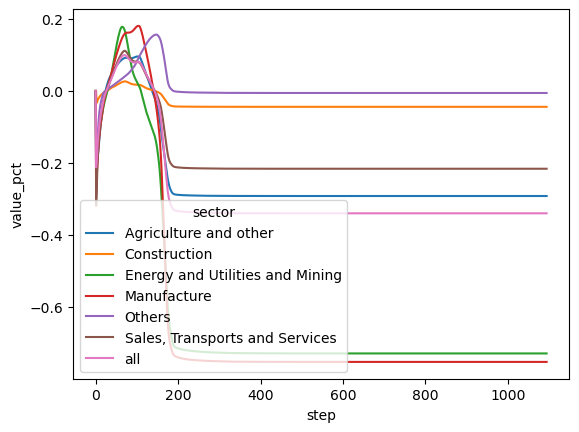

In [29]:
sns.lineplot(data=df.loc[(df.mrio=="eora26_2000_full") & (df.rsce=="reclin3M") & (df.psi=="0.8") & (df.alpha_tau=="1")],x="step", y="value_pct", hue="sector")

In [ ]:
test["xp"] = test["mrio"] + "~" +  test["rsce"] + "~" + test["psi"] + "~" + test["alpha_tau"]

In [ ]:
df_plot

In [ ]:
test['shortage'] = test['n_peaks'] > 1

In [ ]:
tmp = test.loc[(test.n_peaks==1) & (test.sector=="all") & (test.mrio.str.contains("exiobase")) & (test.rsce.str.contains("reb")) & (test.rsce.str.contains("1Y")) & (test.psi=="0.9")].copy()
fig, ax = plt.subplots(figsize=(11, 6))
sns.lineplot(data=tmp, x='step', y='value_cumsum_pct', units=tmp.xp+tmp.sector, ax=ax,estimator=None, lw=0.5, hue="xp")


In [ ]:
tmp = test.loc[(test.n_peaks==2) & (test.mrio.str.contains("exiobase3_ixi_2010_full")) & (test.sector=="Sales, Transports and Services") & (test.length=="1Y")].copy()
fig, ax = plt.subplots(figsize=(11, 6))
sns.lineplot(data=tmp, x='step', y='value_diff', hue='sector', style="mrio", units=tmp.xp, ax=ax,estimator=None)


In [ ]:
sns.set_context("talk")

In [ ]:
#f, ax = plt.subplots(figsize=(16,8))
param_name = 'alpha_tau'
graph = sns.relplot(data=test.loc[(test.n_peaks==1) & (test.sector=="Construction")], x="step",y="value_cumsum_pct",hue=param_name, col="sector", col_wrap=3, kind="line", estimator=None, units=test.mrio+test.rsce+test.psi, lw=0.5)
graph.set(ylabel='Relative change')
graph.figure.suptitle(f"Change in production per sector for different values of {param_name}")
graph.figure.tight_layout()
sns.move_legend(
    graph, loc="upper right", frameon=False, bbox_to_anchor=(1.1,0.7),
)

In [ ]:
plot_df.loc[~plot_df.absurd].sort_values("value_imp_c")

In [ ]:
test

In [ ]:
#f, ax = plt.subplots(figsize=(16,8))
param_name = 'psi'
graph = sns.relplot(data=test, x="step",y="value_pct",hue="xp", row='psi', col="sector", kind="line", estimator=None, units=test.mrio+test.rsce+test.alpha_tau, lw=0.5, legend=False)
graph.set(ylabel='Relative change')
graph.figure.suptitle(f"Change in production per sector for different values of {param_name}")
graph.figure.tight_layout()

In [ ]:
param_name="rsce"
graph = sns.relplot(data=test.loc[test.rsce.str.contains("rec")], x="step",y="value_cumsum_pct",hue=param_name, col="sector", col_wrap=3, kind="line", estimator=None, units=test.mrio+test.psi+test.alpha_tau+test.rectype, lw=0.5)
graph.set(ylabel='Relative change')
graph.figure.suptitle(f"Change in production per sector for different values of {param_name}")
graph.figure.tight_layout()
sns.move_legend(
    graph, loc="upper right", frameon=False, bbox_to_anchor=(1.1,0.7),
)

In [ ]:
param_name="mrio"
graph = sns.relplot(data=test.loc[test.rsce.str.contains("rec")], x="step",y="value_pct",hue=param_name, col="sector", col_wrap=3, kind="line", estimator=None, units=test.psi+test.alpha_tau+test.rsce, lw=0.5)
graph.set(ylabel='Cumulative relative change')
graph.figure.suptitle(f"Change in production per sector for different values of {param_name}")
graph.figure.tight_layout()
sns.move_legend(
    graph, loc="upper right", frameon=False, bbox_to_anchor=(1.18,0.7),
)

In [ ]:
ex_plot_df1 = df.loc[(df["rsce"]=="reb6M") & (df.psi=="0.97") & (df.sector=="Construction")]
ex_plot_df2 = df.loc[(df["rsce"]=="reb6M") & (df.psi=="0.5") & (df.sector=="Construction")]
ex_plot_df1 = ex_plot_df1.sort_values(by=["mrio","rsce","rectype","length","psi","alpha_tau","sector","step"]).iloc[:400]#.plot(x="step",y="value_pct",ax=ax,legend=False)
ex_plot_df2 = ex_plot_df.sort_values(by=["mrio","rsce","rectype","length","psi","alpha_tau","sector","step"]).iloc[:400]#.plot(x="step",y="value_pct",ax=ax,legend=False)

In [ ]:
graph = sns.relplot(kind="line",data=pd.concat([ex_plot_df2,ex_plot_df1]), x="step", y="value_pct", hue="psi", aspect=2, legend=False,zorder=2)
graph.map(plt.axhline, y=0, ls="--", color="black",zorder=1)
graph.despine()
graph.set_ylabels("")
graph.set_yticklabels("")
graph.fig.suptitle("Example of shortage vs no shortage",y=1.05)
#graph.tick_params(left=False)

#### Param aggregated - No absurd

#### Param sectors

#### Shortages

In [ ]:
param = "Shortage"

plot_df_noabs = plot_df.loc[~plot_df.absurd].copy()
#plot_df_noabs = plot_df.copy()

In [ ]:
plot_df_noabs.loc[(plot_df_noabs["Shortage"]=="No")  & (plot_df_noabs["Shortage_b"]==1)]

In [ ]:
plot_df_noabs.loc[(plot_df_noabs["Shortage"]=="Yes") & (plot_df_noabs["mrio"]=="euregio_2010_full") & (plot_df_noabs["rsce"]=="reclin2Y") & (plot_df_noabs["psi"]=="0.97") & (plot_df_noabs["alpha_tau"]=="730")]

In [ ]:
plot_df_noabs = plot_df_noabs.loc[plot_df_noabs["sector"]=="All sectors"]

colors = ["#1b9e77","#d95f02","#7570b3"]# Set your custom color palette
palette = (sns.color_palette(colors))

PROPS = {
    'boxprops':{'facecolor':'none', 'edgecolor':'red'},
    'medianprops':{'color':'red'},
    'whiskerprops':{'color':'red'},
    'capprops':{'color':'red'}
}


graph = sns.catplot(
    kind="strip", 
    jitter=0.25,
    y = "value_imp_c",
    x = "mrio_name",
    hue = param,
    size=5.5,
    alpha=0.8,
    palette=sns.color_palette("colorblind"),
    dodge=True,
    #legend=False,
    col="rectype",
    col_order=["Without rebuilding demand","With rebuilding demand"],
    #hue_order=["3M","6M","1Y","1_5Y","2Y"],
    #palette=sns.color_palette(),
    data=plot_df_noabs,
    #**PROPS,
    height=7,
    aspect=0.8,
    #sharey=False,
)

graph.map_dataframe(
    sns.boxplot,
    linewidth=1.75,
    width=0.9,
    orient="v",
    color="white",
    fliersize=0,
    y= "value_imp_c",
    x = "mrio_name",
)



graph.map(plt.axhline, y=0, ls="-", c="black")

graph.map(plt.axhline,y=-0.21*100, ls="--", c="black")

ax = graph.facet_axis(0,0)
ax2= graph.facet_axis(0,1)

ax.annotate('Trenczek and Lürh, 2022 (−21%)', xy=(0.35,-21),
            xycoords=('axes fraction',"data"),
            xytext=(-110,-60),
            arrowprops=dict(facecolor='black', edgecolor="black",arrowstyle="-|>", connectionstyle="arc3",relpos=(0.5, 0.5)),
            textcoords='offset points',
            color="black",
            fontsize=12, 
            ha="left",
            #rotation=90,
           )

#plt.axvline(x=-0.25, ls="--", c="red")
#graph.set_xticklabels(['EORA26', 'EXIOBASE3', 'EUREGIO'])
#graph.set_yticklabels(ax.get_yticklabels(), rotation=30)
#graph.set_ylabel("")
graph.set_axis_labels("","% of direct losses")
#graph.set_xlabel("")
graph.set_titles("{col_name}")
#graph.fig.subplots_adjust(top=0.1) # adjust the Figure in rp
graph.fig.suptitle("Cumulated indirect production change three years after the shock",y=1.05)
#set_title()
graph.despine(left=True, bottom=True)
ax.tick_params(bottom=False)
ax2.tick_params(bottom=False)

graph.savefig(f"/home/sjuhel/imgs-general/Plots/Sensitivity/no_outliers_aggregated_influence_of_{param}.png")

display(plot_df_noabs.groupby(["rectype","mrio_name"])['value_imp_c'].describe())

In [ ]:
len(plot_df_noabs.loc[plot_df_noabs.Shortage=="Yes"]) / len(plot_df_noabs) * 100

In [ ]:
len(plot_df_noabs.loc[(plot_df_noabs.Shortage=="Yes") & (plot_df_noabs.rectype=="Without rebuilding demand")]) / len(plot_df_noabs.loc[(plot_df_noabs.rectype=="Without rebuilding demand")]) * 100

In [ ]:
len(plot_df_noabs.loc[(plot_df_noabs.Shortage=="Yes") & (plot_df_noabs.rectype=="With rebuilding demand")]) / len(plot_df_noabs.loc[(plot_df_noabs.rectype=="With rebuilding demand")]) * 100

#### Hallegatte's values

#### Param aggreg - Absurd

In [ ]:
plot_df = plot_df.loc[plot_df.psi!="1.0"]
plot_df = plot_df.loc[plot_df.alpha_tau!="1"]

In [ ]:
param = "Recovery length (days)"

plot_df_noabs = plot_df.copy()
#plot_df_noabs = plot_df.copy()
plot_df_noabs['Shortage'] = np.where(plot_df_noabs['n_peaks'] > 1,"Yes","No")
plot_df_noabs = plot_df_noabs.sort_values(by=["mrio_name_full",param])
plot_df_noabs = plot_df_noabs.loc[(plot_df_noabs.time_looked=="2y") & (plot_df_noabs.sector.str.contains("All"))].copy()
colors = ["#1b9e77","#d95f02","#7570b3"]# Set your custom color palette
palette = (sns.color_palette(colors))

PROPS = {
    'boxprops':{'facecolor':'none', 'edgecolor':'red'},
    'medianprops':{'color':'red'},
    'whiskerprops':{'color':'red'},
    'capprops':{'color':'red'}
}


graph = sns.catplot(
    kind="strip", 
    jitter=0.25,
    y = "value_imp_c",
    x = "mrio_name",
    hue = param,
    size=5.5,
    alpha=0.9,
    palette=sns.color_palette("colorblind"),
    dodge=True,
    #legend=False,
    col="rectype",
    col_order=["Without rebuilding demand","With rebuilding demand"],
    #hue_order=["3M","6M","1Y","1_5Y","2Y"],
    #palette=sns.color_palette(),
    data=plot_df_noabs,
    #**PROPS,
    height=7,
    aspect=0.8,
    #sharey=False,
)

graph.map_dataframe(
    sns.boxplot,
    linewidth=1.75,
    width=0.9,
    orient="v",
    color="white",
    fliersize=0,
    y= "value_imp_c",
    x = "mrio_name",
)



graph.map(plt.axhline, y=0, ls="-", c="black")

graph.map(plt.axhline,y=-0.21*100, ls="--", c="black")

ax = graph.facet_axis(0,0)
ax2= graph.facet_axis(0,1)

ax.annotate('Trenczek and Lürh, 2022 (−21%)', xy=(0.35,-21),
            xycoords=('axes fraction',"data"),
            xytext=(-110,-60),
            arrowprops=dict(facecolor='black', edgecolor="black",arrowstyle="-|>", connectionstyle="arc3",relpos=(0.5, 0.5)),
            textcoords='offset points',
            color="black",
            fontsize=12, 
            ha="left",
            #rotation=90,
           )

#plt.axvline(x=-0.25, ls="--", c="red")
#graph.set_xticklabels(['EORA26', 'EXIOBASE3', 'EUREGIO'])
#graph.set_yticklabels(ax.get_yticklabels(), rotation=30)
#graph.set_ylabel("")
graph.set_axis_labels("","% of direct losses")
#graph.set_xlabel("")
graph.set_titles("{col_name}")
#graph.fig.subplots_adjust(top=0.1) # adjust the Figure in rp
graph.fig.suptitle("Indirect production change two years after the shock",y=1.05)
#set_title()
graph.despine(left=True, bottom=True)
ax.tick_params(bottom=False)
ax2.tick_params(bottom=False)

graph.savefig(f"/home/sjuhel/imgs-general/Plots/Sensitivity/aggregated_influence_of_{param}_nopsi1atau1.png")

display(plot_df_noabs.groupby(["rectype","mrio_name"])['value_imp_c'].describe())

#### Shortages per MRIOT

In [ ]:
import numpy as np

plot_df_noabs = plot_df.loc[~plot_df.absurd].copy()
plot_df_noabs['Shortage'] = np.where(plot_df_noabs['n_peaks'] > 1,"Shortage","No shortage")
plot_df_noabs=plot_df_noabs.loc[(plot_df_noabs.time_looked=="2y") & (plot_df_noabs.mrio.str.contains("2010"))]#.reset_index().drop("index",axis=1)
plot_df_noabs = plot_df_noabs.sort_values(by=["mrio_name","sector"])
colors = ['#1b9e77','#d95f02','#7570b3']# Set your custom color palette
palette = (sns.color_palette(colors))

PROPS = {
    'boxprops':{'facecolor':'none', 'edgecolor':'red'},
    'medianprops':{'color':'red'},
    'whiskerprops':{'color':'red'},
    'capprops':{'color':'red'}
}

graph = sns.catplot(
    plot_df_noabs,
    col_order=["No rebuilding demand","Rebuilding demand"],
    col="rectype",
    row="mrio_name",
    kind="strip",
    #linewidth=1.75,
    #width=0.9,
    #orient="v",
    jitter=0.3,
    #color="white",
    hue="Shortage",
    #fliersize=0,
    y="value_cumsum_pct",
    x = "sector",
    #   **PROPS,
    height=6,
    aspect=0.7,
    size=4.,
    alpha=0.8,
    dodge=True,
    palette=palette,
    legend=True,
    #legend_out=True,
)

graph.map_dataframe(
    sns.boxplot, 
    #jitter=0.25,
    fliersize=0,
    y="value_cumsum_pct",
    x = "sector",
    color="white",
    #legend=False,
    #size=3.5,
    #alpha=0.8,
    #palette=palette,
    #**PROPS,
)

#graph.add_legend()

graph.map(plt.axhline, y=0, ls="-", c="black")

ax1 = graph.facet_axis(0,0)
ax2 = graph.facet_axis(0,1)
#ax3 = graph.facet_axis(1,0)
#ax4 = graph.facet_axis(1,1)


sns.move_legend(graph, loc="lower right", title="", bbox_to_anchor=(1, 0.85))


#plt.axvline(x=-0.25, ls="--", c="red")
#graph.set_xticklabels(['EORA26', 'EUREGIO', 'EXIOBASE3'])
graph.set_xticklabels(graph.facet_axis(2,1).get_xticklabels(), rotation=90)
#graph.set_ylabel("")
graph.set_axis_labels("","% of yearly production")
#graph.set_xlabel("")
graph.set_titles("{col_name}\n{row_name}")
#graph.fig.subplots_adjust(top=0.1) # adjust the Figure in rp
graph.fig.suptitle("Indirect production change two years after the shock",y=1.00)
#set_title()
graph.despine(left=True, bottom=True)
ax1.tick_params(bottom=False)
ax2.tick_params(bottom=False)
#ax3.tick_params(bottom=False)
#ax4.tick_params(bottom=False)
plt.tight_layout()
#plt.subplots_adjust(hspace=0, wspace=0.15)
#graph.set(ylim=(-300, 50))
#plt.grid(visible=True,axis="x", linestyle='-', linewidth=2)

### Other region

#### Shortages

In [ ]:
plot_df_noabs = plot_df_noabs.loc[plot_df_noabs.rectype=="With rebuilding demand"]
(len(plot_df_noabs[plot_df_noabs.Shortage=="Yes"]) / len(plot_df_noabs)) * 100

In [ ]:
import numpy as np

plot_df_noabs = plot_df.loc[~plot_df.absurd].copy()
plot_df_noabs['Shortage'] = np.where(plot_df_noabs['n_peaks'] > 1,"Shortage","No shortage")
plot_df_noabs=plot_df_noabs.loc[(plot_df_noabs.time_looked=="2y") & (plot_df_noabs.mrio.str.contains("2010")) & (plot_df_noabs.sector.str.contains("All"))]#.reset_index().drop("index",axis=1)
plot_df_noabs = plot_df_noabs.sort_values(by="mrio")
colors = ['#1b9e77','#d95f02','#7570b3']# Set your custom color palette
palette = (sns.color_palette(colors))

PROPS = {
    'boxprops':{'facecolor':'none', 'edgecolor':'red'},
    'medianprops':{'color':'red'},
    'whiskerprops':{'color':'red'},
    'capprops':{'color':'red'}
}

graph = sns.catplot(
    plot_df_noabs,
    col_order=["No rebuilding demand","Rebuilding demand"],
    col="rectype",
    #row="mrio_name",
    kind="strip",
    #linewidth=1.75,
    #width=0.9,
    #orient="v",
    jitter=0.3,
    #color="white",
    hue="Shortage",
    #fliersize=0,
    y = "value_imp_c",
    x = "mrio",
    #   **PROPS,
    height=5.5,
    aspect=0.9,
    size=4.,
    #alpha=0.8,
    dodge=True,
    palette=palette,
    legend=True,
    #legend_out=True,
)

graph.map_dataframe(
    sns.boxplot, 
    #jitter=0.25,
    fliersize=0,
    y="value_imp_c",
    x = "mrio",
    color="white",
    #legend=False,
    #size=3.5,
    #alpha=0.8,
    #palette=palette,
    #**PROPS,
)

#graph.add_legend()

graph.map(plt.axhline, y=0, ls="-", c="black")

ax1 = graph.facet_axis(0,0)
ax2 = graph.facet_axis(0,1)
#ax3 = graph.facet_axis(1,0)
#ax4 = graph.facet_axis(1,1)


sns.move_legend(graph, loc="lower right", title="", bbox_to_anchor=(1.15, 0.40))

#plt.axvline(x=-0.25, ls="--", c="red")
graph.set_xticklabels(['EORA26', 'EUREGIO', 'EXIOBASE3'])
graph.set_yticklabels(ax1.get_yticklabels(), rotation=30)
#graph.set_ylabel("")
graph.set_axis_labels("","% of direct losses")
#graph.set_xlabel("")
graph.set_titles("{col_name}")
#graph.fig.subplots_adjust(top=0.1) # adjust the Figure in rp
graph.fig.suptitle("Indirect production change two years after the shock",y=0.95)
#set_title()
graph.despine(left=True, bottom=True)
ax1.tick_params(bottom=False)
ax2.tick_params(bottom=False)
#ax3.tick_params(bottom=False)
#ax4.tick_params(bottom=False)
plt.tight_layout()
#plt.subplots_adjust(hspace=0, wspace=0.15)
#graph.set(ylim=(-300, 50))
#plt.grid(visible=True,axis="x", linestyle='-', linewidth=2)

graph.savefig(f"/home/sjuhel/imgs-general/Plots/Sensitivity/no_outliers_shortage_compare_in_{region}.png")

# MRIOT compare

In [ ]:
import pickle as pkl

with open("../BoARIO-Sensitivity/mrio-files/pkls/exiobase3/exiobase3_full_2000_ixi.pkl",'rb') as f:
    exio2000 = pkl.load(f)
    
with open("../BoARIO-Sensitivity/mrio-files/pkls/exiobase3/exiobase3_full_2010_ixi.pkl",'rb') as f:
    exio2010 = pkl.load(f)
    
with open("../BoARIO-Sensitivity/mrio-files/pkls/eora26/eora26_full_2000.pkl",'rb') as f:
    eora2000 = pkl.load(f)
    
with open("../BoARIO-Sensitivity/mrio-files/pkls/eora26/eora26_full_2010.pkl",'rb') as f:
    eora2010 = pkl.load(f)
    
with open("../BoARIO-Sensitivity/mrio-files/pkls/euregio/euregio_full_2000.pkl",'rb') as f:
    eureg2000 = pkl.load(f)
    
with open("../BoARIO-Sensitivity/mrio-files/pkls/euregio/euregio_full_2010.pkl",'rb') as f:
    eureg2010 = pkl.load(f)

In [ ]:
def load_regions_aggreg(mrio_name):
    if "eora26" in mrio_name:
        return regions_common_aggreg["eora26_without_reexport_to_common_aggreg"]
    elif "euregio" in mrio_name:
        return regions_common_aggreg["euregio_to_common_aggreg"]
    elif "exiobase" in mrio_name:
        return regions_common_aggreg["exiobase_full_to_common_aggreg"]
    elif "oecd" in mrio_name:
        return regions_common_aggreg["icio2021_reworked_to_common_aggreg"]
    else:
        raise ValueError(f"Invalid MRIO name: {mrio_name}")
        

In [ ]:
mriots = {}
for name, mriot, mriot_type in zip(["EXIOBASE3 2000","EXIOBASE3 2010","EORA26 2000","EORA26 2010","EUREGIO 2000","EUREGIO 2010"],[exio2000,exio2010, eora2000, eora2010, eureg2000, eureg2010],["exiobase","exiobase","eora26","eora26","euregio","euregio"]):
    region_agg = load_regions_aggreg(mriot_type)
    sector_agg = load_sectors_aggreg(mriot_type)
    mriot.rename_sectors(sector_agg["new sector"].to_dict())
    mriot.rename_regions(region_agg["new region"].to_dict())
    mriot.aggregate_duplicates()
    mriot.calc_all()
    mriot = lexico_reindex(mriot)
    mriot.A.columns = mriot.A.columns.rename("output sector", level=1)
    mriot.A.columns = mriot.A.columns.rename("output region", level=0)
    mriot.A.index = mriot.A.index.rename("input sector", level=1)
    mriot.A.index = mriot.A.index.rename("input region", level=0)
    mriots[name] = mriot

In [ ]:
_df = np.abs(mriots["EXIOBASE3 2010"].A-mriots["EORA26 2010"].A) / mriots["EXIOBASE3 2010"].A
_df

In [ ]:
def generate_mriot_diff_plot(mriots, name_1, name_2, floor_cap=None, log=False, ax=None):
    if ax is None:
        ax = plt.gca()
    if log:
        _df = np.log10(np.abs(mriots[name_1].A-mriots[name_2].A)/mriots[name_1].A).copy()
        log_str = "log10 of"
    else:
        _df = (np.abs(mriots[name_1].A-mriots[name_2].A)/mriots[name_1].A).copy()
        log_str = ""
    if floor_cap:
        _df = _df[_df > floor_cap].copy()
    _df[_df == np.inf] = None
    sns.heatmap(_df, ax=ax, linewidths=0.005, cmap="Reds",cbar_kws={'label': log_str+'absolute relative difference'})
    plt.title(f"Comparing technical coefficients of {name_2} with {name_1}", fontdict={"fontsize":18})
    return(ax)

In [ ]:
sns.set_context("paper")
MRIO1 = "EXIOBASE3 2010"
MRIO2 = "EXIOBASE3 2000"
fig, ax = plt.subplots(figsize=(12,8))
generate_mriot_diff_plot(mriots, MRIO1, MRIO2, log=True, floor_cap=1e-1)
fig.savefig(f"../../../Latex/imgs-general/Plots/Sensitivity/Comparing_MRIOT_{MRIO1}_with_{MRIO2}.png", bbox_inches="tight")

In [ ]:
pd.set_option('display.float_format', lambda x: '%8.8f' % x)
pd.set_option('display.precision',8)
pd.concat([mriots["EORA26 2010"].A.loc[("DEU","Construction")],mriots["EUREGIO 2010"].A.loc[("DEU","Construction")],mriots["EXIOBASE3 2010"].A.loc[("DEU","Construction")]],axis=1)